# BNFMIP Site-Level Evaluation — ELM-FUN

**Protocol:** Temperature Response of Biological Nitrogen Fixation Model Intercomparison (Bytnerowicz et al. 2024)  
**Contact:** Renato Braghiere  
**Cases:** 4 BNF approaches × 3 sites (Manaus, Harvard Forest, Bonanza Creek) — 1850–2100

| Experiment | BNF Temperature Function | Description |
|---|---|---|
| `nofun_baseline` | Houlton et al. (2008) | ELM default (no FUN cost model) |
| `fun_transient_only` | Houlton et al. (2008) | ELM-FUN default |
| `noacc_transient` | Bytnerowicz et al. (2022), no acclimation | Temperate/Tropical functions |
| `acc_transient` | Bytnerowicz et al. (2022), with acclimation | Temperate/Tropical + T30 acclimation |

In [59]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
import glob
import os
import warnings
warnings.filterwarnings('ignore')

# Ensure plots are displayed inline
%matplotlib inline
plt.rcParams.update({
    'figure.dpi': 120,
    'font.size': 10,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'legend.fontsize': 9,
})

## 1. Configuration

In [60]:
RUNROOT = '/lustre/or-scratch/cades-ccsi/scratch/braghiere'
DATE    = '20260521'

# Site definitions
SITES = {
    'Manaus':         {'tag': 'manaus', 'SITE': 'Man',  'lat': -3.119,  'lon': -60.022, 'biome': 'Tropical',   'pft': 'BET'},
    'Harvard Forest': {'tag': 'ha1',    'SITE': 'Ha1',  'lat': 42.532,  'lon': -72.190, 'biome': 'Temperate',  'pft': 'BDT'},
    'Bonanza Creek':  {'tag': 'bon',    'SITE': 'Bon',  'lat': 64.859,  'lon': -147.847,'biome': 'Boreal',     'pft': 'NET'},
}

# Experiment definitions
EXPS = {
    'nofun_baseline':    {'label': 'Houlton (no FUN)',   'color': 'k',        'ls': '-'},
    'fun_transient_only':{'label': 'Houlton + FUN',      'color': '#2166ac',  'ls': '-'},
    'noacc_transient':   {'label': 'Bytnerowicz (no acc)','color': '#d6604d', 'ls': '--'},
    'acc_transient':     {'label': 'Bytnerowicz (acc)',   'color': '#f4a582', 'ls': '-.'},
}

COMPSET = 'I20TRCNPRDCTCBC'

def case_name(exp, site_info):
    """Return the OLMT case directory name."""
    return f"{exp}_{site_info['tag']}_{DATE}_BNF-{site_info['SITE']}_{COMPSET}"

def run_dir(exp, site_info):
    return os.path.join(RUNROOT, case_name(exp, site_info), 'run')

# Verify directories exist
for site, sinfo in SITES.items():
    for exp in EXPS:
        rd = run_dir(exp, sinfo)
        n = len(glob.glob(os.path.join(rd, '*.h0.*.nc')))
        print(f"{exp:25s} | {site:15s} | {n:4d} h0 files | {rd.split('/')[-2]}")

nofun_baseline            | Manaus          |  337 h0 files | nofun_baseline_manaus_20260521_BNF-Man_I20TRCNPRDCTCBC
fun_transient_only        | Manaus          |  337 h0 files | fun_transient_only_manaus_20260521_BNF-Man_I20TRCNPRDCTCBC
noacc_transient           | Manaus          |  337 h0 files | noacc_transient_manaus_20260521_BNF-Man_I20TRCNPRDCTCBC
acc_transient             | Manaus          |  318 h0 files | acc_transient_manaus_20260521_BNF-Man_I20TRCNPRDCTCBC
nofun_baseline            | Harvard Forest  |  337 h0 files | nofun_baseline_ha1_20260521_BNF-Ha1_I20TRCNPRDCTCBC
fun_transient_only        | Harvard Forest  |  337 h0 files | fun_transient_only_ha1_20260521_BNF-Ha1_I20TRCNPRDCTCBC
noacc_transient           | Harvard Forest  |  337 h0 files | noacc_transient_ha1_20260521_BNF-Ha1_I20TRCNPRDCTCBC
acc_transient             | Harvard Forest  |  337 h0 files | acc_transient_ha1_20260521_BNF-Ha1_I20TRCNPRDCTCBC
nofun_baseline            | Bonanza Creek   |  337 h0 files | nofun_

## 2. BNF Temperature Response Functions

Visualise the three BNF temperature functions used in the protocol.

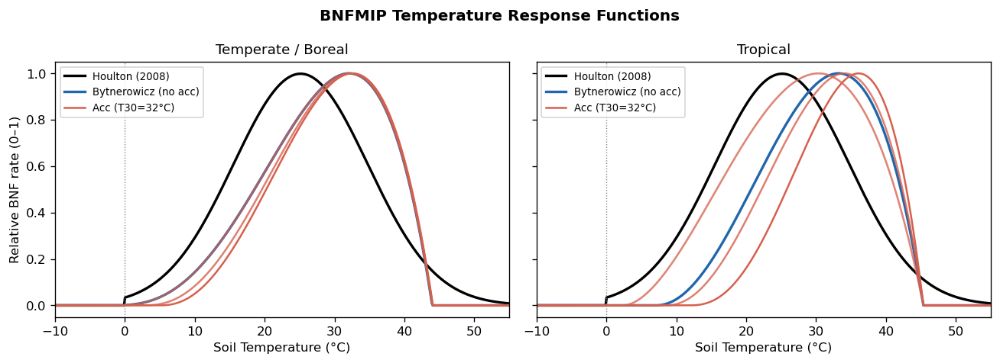

In [61]:
T = np.linspace(-10, 55, 500)

# ── Houlton et al. (2008) ──────────────────────────────────────────────────
def houlton2008(Ts, a=-3.62, b=0.27, c=25.15):
    y = 1.25 * np.exp(a + b*Ts * (1 - 0.5*Ts/c))
    y = np.where(Ts > 0, y, 0.0)
    return np.clip(y, 0, 1)

# ── Bytnerowicz et al. (2022) Equation 2 ──────────────────────────────────
def bytnerowicz_eq2(Ts, Tmin, Topt, Tmax, ymax=1.0):
    exponent = (Topt - Tmin) / (Tmax - Topt)
    num   = (Tmax - Ts) * (Ts - Tmin)**exponent
    denom = (Tmax - Topt) * (Topt - Tmin)**exponent
    y = ymax * np.where((Ts > Tmin) & (Ts < Tmax), num / denom, 0.0)
    y = np.where(Ts > 0, y, 0.0)
    return np.clip(y, 0, 1)

# No-acclimation parameters
y_noac_temp = bytnerowicz_eq2(T, Tmin=-2.04, Topt=32.10, Tmax=43.98)   # Temperate/Boreal
y_noac_trop = bytnerowicz_eq2(T, Tmin= 7.04, Topt=33.22, Tmax=45.35)   # Tropical

# Acclimation example: T30 = 10 °C (cool), 20 °C (warm), 30 °C (hot) — temperate
def bytnerowicz_acc_temp(Ts, T30):
    """Bytnerowicz (2022) acclimation — temperate/boreal."""
    if T30 < 18.5:
        Tmin, Topt, Tmax = -2.04, 32.10, 43.98
    elif T30 <= 28.5:
        Tmin = 0.697*T30 - 14.93
        Topt = 0.047*T30 + 31.24
        Tmax = 0.009*T30 + 43.82
    else:
        Tmin, Topt, Tmax = 4.93, 32.58, 44.08
    return bytnerowicz_eq2(Ts, Tmin, Topt, Tmax)

def bytnerowicz_acc_trop(Ts, T30):
    """Bytnerowicz (2022) acclimation — tropical."""
    if T30 < 18.5:
        Tmin, Topt = 2.37, 30.34
    elif T30 <= 28.5:
        Tmin = 0.932*T30 - 14.87
        Topt = 0.574*T30 + 19.72
    else:
        Tmin, Topt = 11.69, 36.08
    return bytnerowicz_eq2(Ts, Tmin, Topt, Tmax=45.35)

fig, axes = plt.subplots(1, 2, figsize=(11, 4), sharey=True)

# Temperate/Boreal panel
ax = axes[0]
ax.plot(T, houlton2008(T),          color='k',      lw=2,   label='Houlton (2008)')
ax.plot(T, y_noac_temp,             color='#2166ac', lw=2,  label='Bytnerowicz (no acc)')
for T30, alpha in zip([5, 15, 25, 32], [0.4, 0.6, 0.8, 1.0]):
    ax.plot(T, bytnerowicz_acc_temp(T, T30), color='#d6604d', lw=1.5, alpha=alpha,
            label=f'Acc (T30={T30}°C)' if alpha == 1.0 else '_')
ax.set_title('Temperate / Boreal')
ax.set_xlabel('Soil Temperature (°C)')
ax.set_ylabel('Relative BNF rate (0–1)')
ax.legend(fontsize=8)
ax.axvline(0, color='grey', lw=0.8, ls=':')
ax.set_xlim(-10, 55)

# Tropical panel
ax = axes[1]
ax.plot(T, houlton2008(T),          color='k',       lw=2,  label='Houlton (2008)')
ax.plot(T, y_noac_trop,             color='#2166ac',  lw=2, label='Bytnerowicz (no acc)')
for T30, alpha in zip([5, 15, 25, 32], [0.4, 0.6, 0.8, 1.0]):
    ax.plot(T, bytnerowicz_acc_trop(T, T30), color='#d6604d', lw=1.5, alpha=alpha,
            label=f'Acc (T30={T30}°C)' if alpha == 1.0 else '_')
ax.set_title('Tropical')
ax.set_xlabel('Soil Temperature (°C)')
ax.legend(fontsize=8)
ax.axvline(0, color='grey', lw=0.8, ls=':')
ax.set_xlim(-10, 55)

fig.suptitle('BNFMIP Temperature Response Functions', fontweight='bold')
plt.tight_layout()
plt.savefig('bnfmip_temp_response_functions.png', bbox_inches='tight')
plt.show()

## 3. Data Loading

In [62]:
# Load all 12 cases
# DATA[site_name][exp_name] = xr.Dataset

DATA = {}
for site, sinfo in SITES.items():
    DATA[site] = {}
    for exp in EXPS:
        try:
            print(f'Loading {exp} / {site} ...', end=' ', flush=True)
            DATA[site][exp] = load_case(exp, sinfo, variables=ALL_VARS)
            n = DATA[site][exp].dims.get('time', '?')
            print(f'{n} time steps')
        except Exception as e:
            print(f'ERROR: {e}')
            DATA[site][exp] = None

print('\nDone.')

Loading nofun_baseline / Manaus ... 3012 time steps
Loading fun_transient_only / Manaus ... 3012 time steps
Loading noacc_transient / Manaus ... 3012 time steps
Loading acc_transient / Manaus ... 3012 time steps
Loading nofun_baseline / Harvard Forest ... 3012 time steps
Loading fun_transient_only / Harvard Forest ... 3012 time steps
Loading noacc_transient / Harvard Forest ... 3012 time steps
Loading acc_transient / Harvard Forest ... 3012 time steps
Loading nofun_baseline / Bonanza Creek ... 3012 time steps
Loading fun_transient_only / Bonanza Creek ... 3012 time steps
Loading noacc_transient / Bonanza Creek ... 3012 time steps
Loading acc_transient / Bonanza Creek ... 3012 time steps

Done.


## 4. Protocol Output Variables — Annual Time Series

Time series of key protocol variables (1850–2100) for each site and BNF approach.

In [63]:

def plot_var_3sites(var_name, unit, label, flux=True, scale=1.0,
                   derived=None, title_suffix='', refs=None):
    """
    Three-panel plot (one per site), all experiments overlaid.
    flux=True: annual sum (kgX/m2/yr × scale); flux=False: annual mean.
    derived: callable(ds) → DataArray (must return gX/m²/s for flux vars).
    scale: multiply annual_sum/mean result (e.g. 1e3 for kg→g).
    refs: {site_name: {'lo': float, 'hi': float, 'source': str,
                        optional 'central': float}}
          Values must be in the same units as the plotted axis.
    """
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch

    fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharey=False)
    ref_handle_added = False
    ref_handles = []

    for ax, site in zip(axes, SITES):
        for exp, einfo in EXPS.items():
            ds = DATA[site].get(exp)
            if ds is None:
                continue
            try:
                if derived is not None:
                    da = derived(ds)
                    if flux:
                        days = da.time.dt.days_in_month
                        da_ann = (da * days * 86400 * 1e-3).resample(time='1Y').sum()
                    else:
                        da_ann = da.resample(time='1Y').mean()
                elif flux:
                    da_ann = annual_sum(ds, var_name)
                else:
                    da_ann = annual_mean(ds, var_name)
                years = da_ann.time.dt.year.values
                ax.plot(years, da_ann.values * scale,
                        color=einfo['color'], ls=einfo['ls'],
                        lw=1.5, label=einfo['label'])
            except Exception as e:
                print(f'  skip {exp}/{site}/{var_name}: {e}')

        # Literature reference band
        if refs and site in refs:
            r = refs[site]
            lo, hi = r['lo'], r['hi']
            ax.axhspan(lo, hi, alpha=0.13, color='#2ca02c', zorder=0)
            if 'central' in r and r['central'] is not None:
                ax.axhline(r['central'], color='#2ca02c', lw=1.2, ls=':', alpha=0.8, zorder=1)
            src = r.get('source', '')
            ax.text(0.02, 0.97, f"Obs: {lo:.2g}–{hi:.2g} ({src})",
                    transform=ax.transAxes, fontsize=7, va='top',
                    color='#1a7a1a', style='italic')
            if not ref_handle_added:
                ref_handles.append(Patch(fc='#2ca02c', alpha=0.3, label='Obs. range (lit.)'))
                ref_handle_added = True

        ax.set_title(f'{site}\n({SITES[site]["biome"]})')
        ax.set_xlabel('Year')
        ax.axvline(2015, color='grey', lw=0.8, ls=':')
        ax.axvline(1850, color='grey', lw=0.4, ls=':')

    axes[0].set_ylabel(f'{label} ({unit})')
    exp_handles = [Line2D([0], [0], color=e['color'], ls=e['ls'], lw=1.5, label=e['label'])
                   for e in EXPS.values()]
    all_handles = exp_handles + ref_handles
    fig.legend(handles=all_handles, loc='lower center', ncol=len(all_handles),
               bbox_to_anchor=(0.5, -0.08))
    fig.suptitle(f'{label}{title_suffix}', fontweight='bold', y=1.01)
    plt.tight_layout()
    safe = label.replace(' ', '_').replace('/', '-').lower()
    plt.savefig(f'bnfmip_{safe}.png', bbox_inches='tight')
    plt.show()


In [64]:

# =============================================================================
# Literature reference ranges for observed values at each site
# ALL values in the same units as the corresponding plot_var_3sites call.
# Sources: Cleveland+99 = Cleveland et al. (1999), GBC;
#          Beer+10 = Beer et al. (2010), Science;
#          Malhi+04 = Malhi et al. (2004), J. Geophys. Res.;
#          Luyssaert+07 = Luyssaert et al. (2007), GCB;
#          Sullivan+14 = Sullivan et al. (2014), Nat. Plants;
#          D-B&F+20 = Davies-Barnard & Friedlingstein (2020), BGS;
#          Reed+11 = Reed et al. (2011), Ecol. Mono.;
#          Vitousek+13 = Vitousek et al. (2013), Nat. Geosci.;
#          Hedin+09 = Hedin et al. (2009), PNAS;
#          McWilliam+93 = McWilliam et al. (1993), Funct. Ecol.;
#          Myneni+07 = Myneni et al. (2007), GRL;
#          Ollinger+05 = Ollinger et al. (2005), Ecology;
#          da Rocha+04 = da Rocha et al. (2004), Ecol. Appl.;
#          Fisher+09 = Fisher et al. (2009), GCB;
#          Reich+97 = Reich et al. (1997), PNAS;
#          Vitousek+10 = Vitousek et al. (2010), Nat. Geosci.;
#          Lambers+10 = Lambers et al. (2010), Plant Cell Environ.
# =============================================================================

# --- Carbon fluxes (kgC m⁻² yr⁻¹) ---
LIT_GPP = {
    'Manaus':         {'lo': 2.5, 'hi': 3.5, 'central': 3.0,
                       'source': 'Beer+10; Araújo+02'},
    'Harvard Forest': {'lo': 1.2, 'hi': 1.8, 'central': 1.5,
                       'source': 'Urbanski+07; Beer+10'},
    'Bonanza Creek':  {'lo': 0.4, 'hi': 1.0, 'central': 0.65,
                       'source': 'Beer+10; FLUXNET'},
}
LIT_NPP = {
    'Manaus':         {'lo': 0.8, 'hi': 1.3, 'central': 1.05,
                       'source': 'Malhi+04; Luyssaert+07'},
    'Harvard Forest': {'lo': 0.4, 'hi': 0.65, 'central': 0.55,
                       'source': 'Jenkins+99; FLUXNET'},
    'Bonanza Creek':  {'lo': 0.15, 'hi': 0.35, 'central': 0.25,
                       'source': 'Chapin+95; MODIS'},
}

# --- BNF (gN m⁻² yr⁻¹; scale=1e3 applied in plot calls) ---
LIT_BNF_TOTAL = {
    'Manaus':         {'lo': 0.5,  'hi': 3.0,  'central': 1.5,
                       'source': 'Cleveland+99; Sullivan+14'},
    'Harvard Forest': {'lo': 0.05, 'hi': 0.5,  'central': 0.2,
                       'source': 'Cleveland+99; Bai+12'},
    'Bonanza Creek':  {'lo': 0.02, 'hi': 0.25, 'central': 0.08,
                       'source': 'Cleveland+99; Leppänen+13'},
}
LIT_BNF_SYMBIOTIC = {
    'Manaus':         {'lo': 0.3,  'hi': 2.5,  'central': 1.2,
                       'source': 'Sullivan+14; D-B&F+20'},
    'Harvard Forest': {'lo': 0.03, 'hi': 0.4,  'central': 0.15,
                       'source': 'Cleveland+99; Vitousek+13'},
    'Bonanza Creek':  {'lo': 0.01, 'hi': 0.08, 'central': 0.03,
                       'source': 'Cleveland+99'},
}
LIT_BNF_FREELIVING = {
    # Free-living BNF (heterotrophic + phyllosphere/cyanobacteria)
    'Manaus':         {'lo': 0.1,  'hi': 1.5,  'central': 0.5,
                       'source': 'Reed+11; Cleveland+99'},
    'Harvard Forest': {'lo': 0.02, 'hi': 0.15, 'central': 0.06,
                       'source': 'Reed+11'},
    'Bonanza Creek':  {'lo': 0.05, 'hi': 0.3,  'central': 0.12,
                       'source': 'Leppänen+13; Zackrisson+04'},
}

# --- N uptake (gN m⁻² yr⁻¹) ---
LIT_NUPTAKE = {
    'Manaus':         {'lo': 3.0, 'hi': 8.0, 'central': 5.0,
                       'source': 'Hedin+09; Vitousek+02'},
    'Harvard Forest': {'lo': 2.0, 'hi': 5.0, 'central': 3.0,
                       'source': 'Aber+93; Nadelhoffer+99'},
    'Bonanza Creek':  {'lo': 0.5, 'hi': 2.0, 'central': 1.0,
                       'source': 'Chapin+95; Vitousek+13'},
}

# --- LAI (m² m⁻², annual mean) ---
LIT_ELAI = {
    'Manaus':         {'lo': 4.5, 'hi': 6.5, 'central': 5.5,
                       'source': 'McWilliam+93; Myneni+07'},
    'Harvard Forest': {'lo': 3.0, 'hi': 5.0, 'central': 4.0,
                       'source': 'Ollinger+05; MODIS'},
    'Bonanza Creek':  {'lo': 1.0, 'hi': 3.5, 'central': 2.0,
                       'source': 'FLUXNET; MODIS'},
}

# --- Evapotranspiration (kgH₂O m⁻² yr⁻¹) ---
LIT_ET = {
    'Manaus':         {'lo': 900,  'hi': 1300, 'central': 1100,
                       'source': 'da Rocha+04; Fisher+09'},
    'Harvard Forest': {'lo': 350,  'hi': 550,  'central': 450,
                       'source': 'Urbanski+07; FLUXNET'},
    'Bonanza Creek':  {'lo': 200,  'hi': 400,  'central': 300,
                       'source': 'FLUXNET; Liu+05'},
}

# --- Transpiration (kgH₂O m⁻² yr⁻¹) ---
LIT_TVEG = {
    'Manaus':         {'lo': 600, 'hi': 1000, 'central': 800,
                       'source': 'Fisher+09; da Rocha+04'},
    'Harvard Forest': {'lo': 200, 'hi': 380,  'central': 280,
                       'source': 'Wilson+01; FLUXNET'},
    'Bonanza Creek':  {'lo': 100, 'hi': 280,  'central': 180,
                       'source': 'FLUXNET'},
}

# --- Leaf N per ground area (gN m⁻² ground) ---
LIT_LEAFN = {
    'Manaus':         {'lo': 3.0, 'hi': 8.0, 'central': 5.0,
                       'source': 'Norby+01; Reich+97'},
    'Harvard Forest': {'lo': 2.5, 'hi': 6.0, 'central': 4.0,
                       'source': 'Reich+97; Niinemets+01'},
    'Bonanza Creek':  {'lo': 1.0, 'hi': 4.0, 'central': 2.5,
                       'source': 'Reich+97; Chapin+95'},
}

# --- Leaf P per ground area (gP m⁻² ground) ---
LIT_LEAFP = {
    'Manaus':         {'lo': 0.15, 'hi': 0.50, 'central': 0.30,
                       'source': 'Vitousek+10; Lambers+10'},
    'Harvard Forest': {'lo': 0.10, 'hi': 0.30, 'central': 0.18,
                       'source': 'McGroddy+04; Tian+10'},
    'Bonanza Creek':  {'lo': 0.06, 'hi': 0.20, 'central': 0.12,
                       'source': 'Reich+97; Chapin+95'},
}

print('Literature reference dicts defined: LIT_GPP, LIT_NPP,',
      'LIT_BNF_TOTAL, LIT_BNF_SYMBIOTIC, LIT_BNF_FREELIVING, LIT_NUPTAKE,',
      'LIT_ELAI, LIT_ET, LIT_TVEG, LIT_LEAFN, LIT_LEAFP')


Literature reference dicts defined: LIT_GPP, LIT_NPP, LIT_BNF_TOTAL, LIT_BNF_SYMBIOTIC, LIT_BNF_FREELIVING, LIT_NUPTAKE, LIT_ELAI, LIT_ET, LIT_TVEG, LIT_LEAFN, LIT_LEAFP


### 4.1 Carbon Fluxes

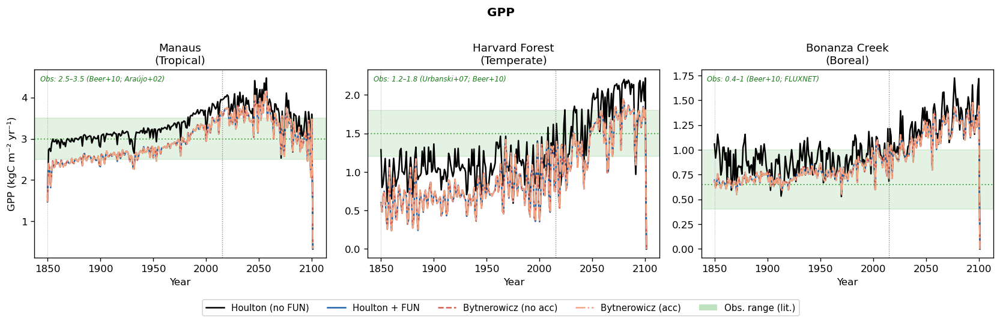

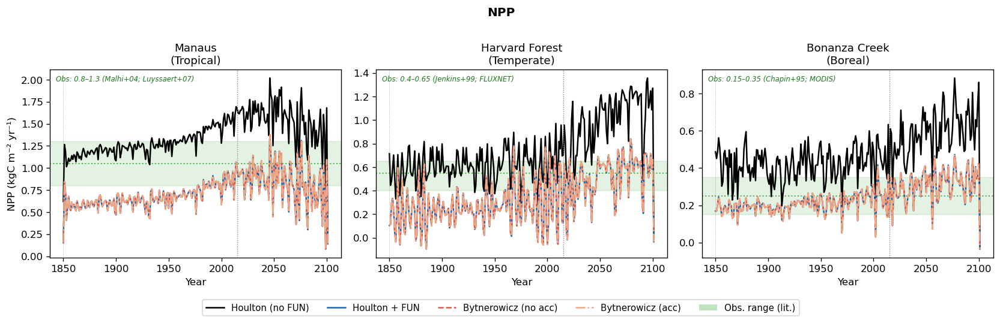

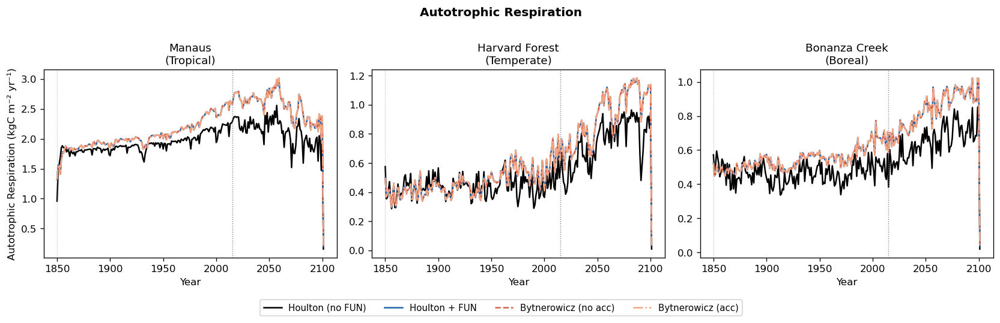

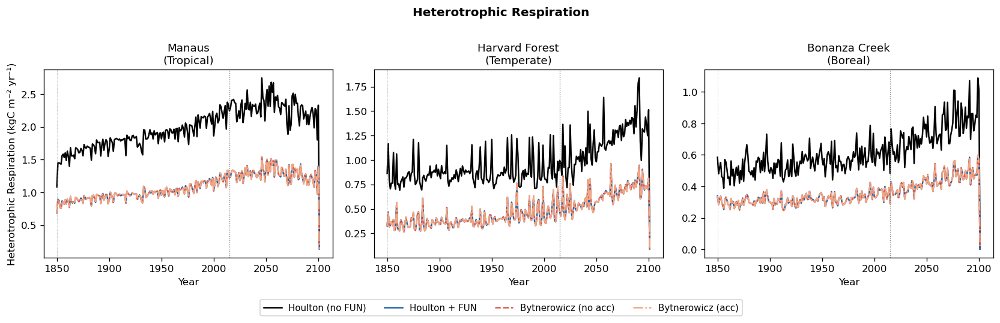

In [65]:

plot_var_3sites('GPP',  'kgC m⁻² yr⁻¹', 'GPP',                         refs=LIT_GPP)
plot_var_3sites('NPP',  'kgC m⁻² yr⁻¹', 'NPP',                         refs=LIT_NPP)
plot_var_3sites('AR',   'kgC m⁻² yr⁻¹', 'Autotrophic Respiration')
plot_var_3sites('HR',   'kgC m⁻² yr⁻¹', 'Heterotrophic Respiration')


### 4.2 Carbon Pools

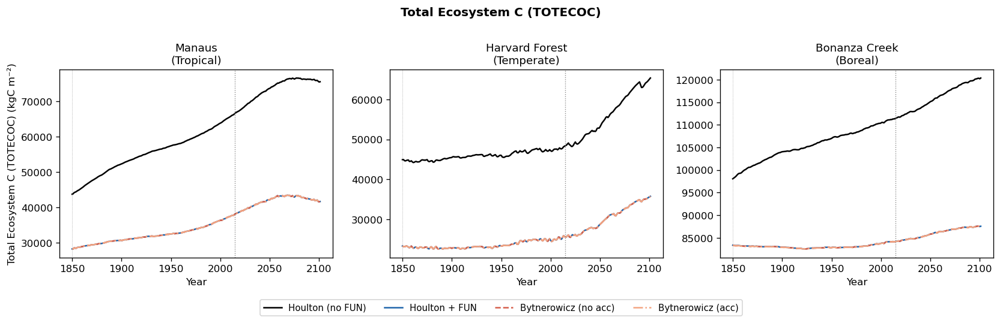

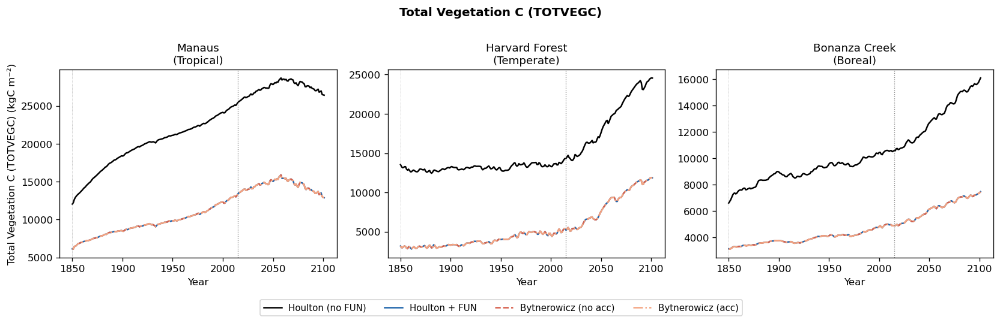

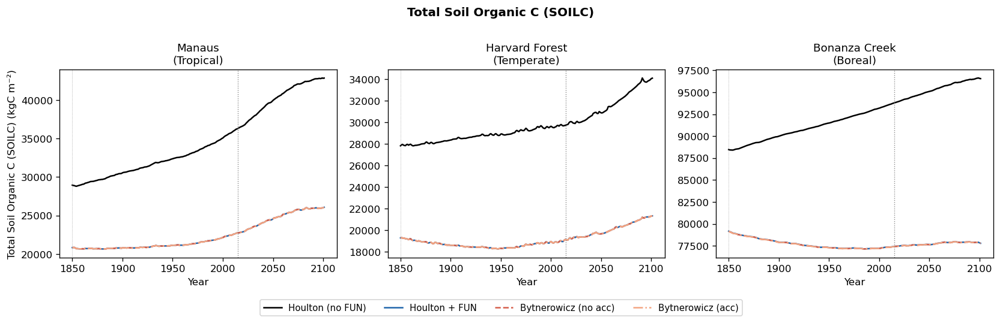

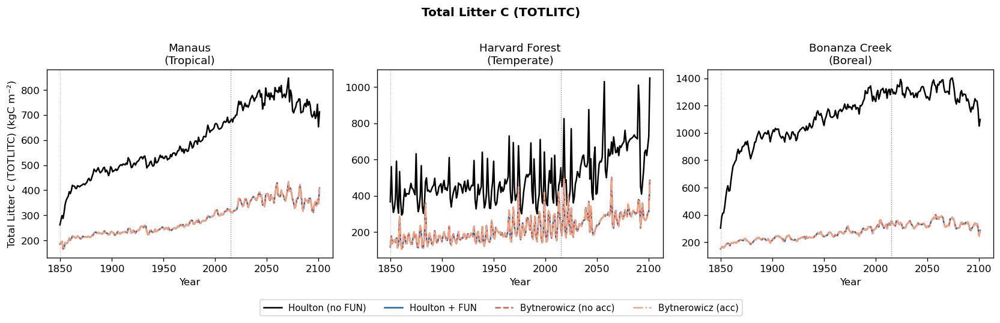

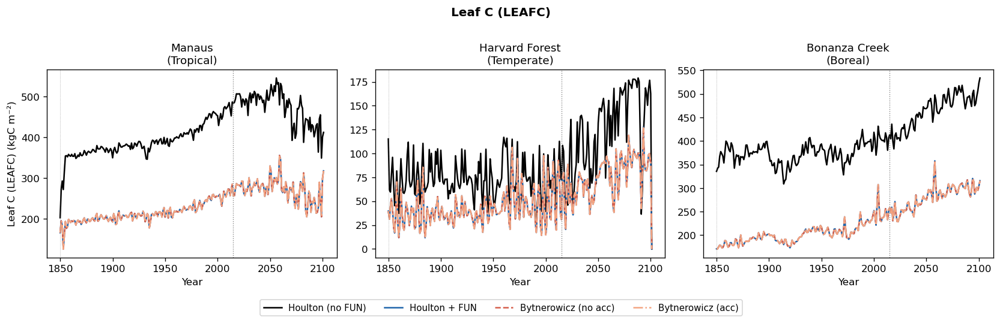

...

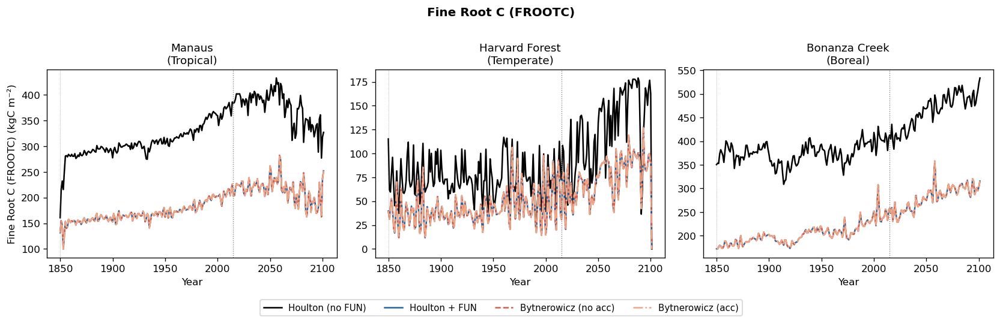

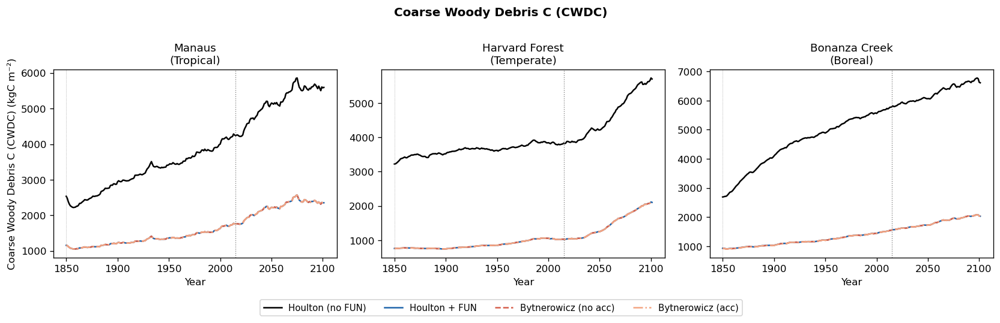

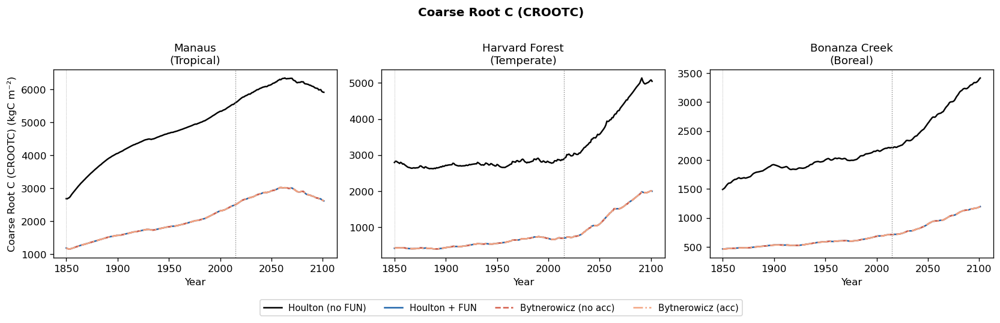

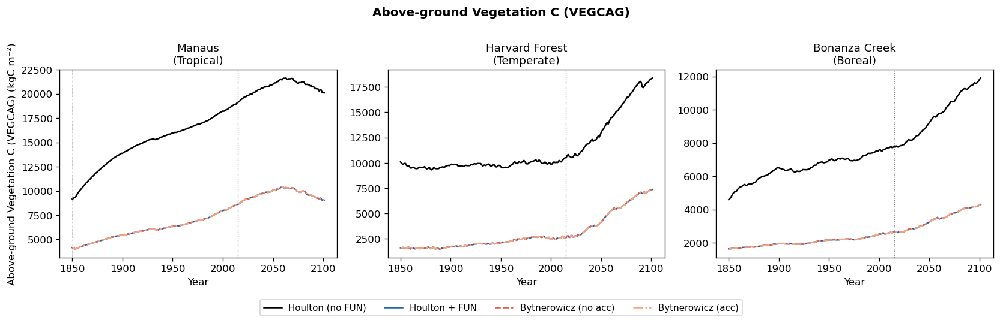

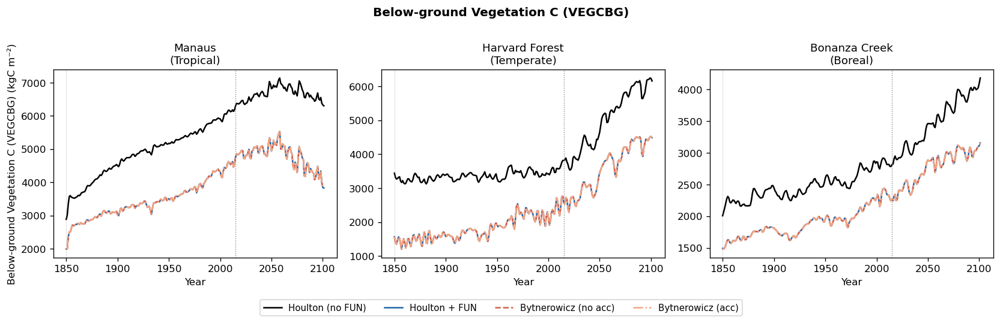

In [66]:
plot_var_3sites('TOTECOSYSC', 'kgC m⁻²', 'Total Ecosystem C (TOTECOC)', flux=False)
plot_var_3sites('TOTVEGC',    'kgC m⁻²', 'Total Vegetation C (TOTVEGC)', flux=False)
plot_var_3sites('TOTSOMC',    'kgC m⁻²', 'Total Soil Organic C (SOILC)', flux=False)
plot_var_3sites('TOTLITC',    'kgC m⁻²', 'Total Litter C (TOTLITC)', flux=False)
plot_var_3sites('LEAFC',      'kgC m⁻²', 'Leaf C (LEAFC)', flux=False)
plot_var_3sites('WOODC',      'kgC m⁻²', 'Wood C (WOODC)', flux=False)
plot_var_3sites('FROOTC',     'kgC m⁻²', 'Fine Root C (FROOTC)', flux=False)
plot_var_3sites('CWDC',       'kgC m⁻²', 'Coarse Woody Debris C (CWDC)', flux=False)

# CROOTC = coarse root C = live + dead coarse root
plot_var_3sites(
    None, 'kgC m⁻²', 'Coarse Root C (CROOTC)', flux=False,
    derived=lambda ds: ds['DEADCROOTC'] + ds['LIVECROOTC']
)

# VEGCAG = above-ground veg C
plot_var_3sites('TOTVEGC_ABG', 'kgC m⁻²', 'Above-ground Vegetation C (VEGCAG)', flux=False)

# VEGCBG = below-ground veg C = TOTVEGC - TOTVEGC_ABG
plot_var_3sites(
    None, 'kgC m⁻²', 'Below-ground Vegetation C (VEGCBG)', flux=False,
    derived=lambda ds: ds['TOTVEGC'] - ds['TOTVEGC_ABG']
)

### 4.3 Nitrogen Fixation

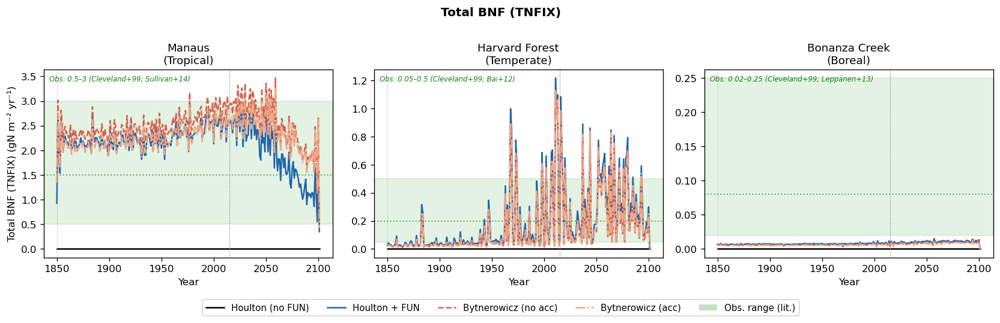

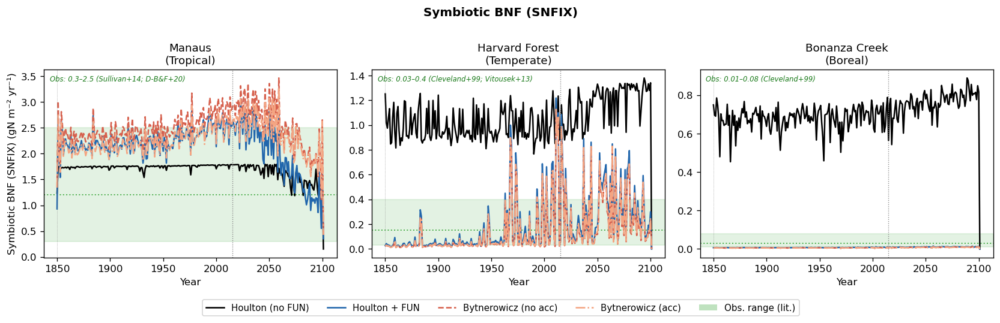

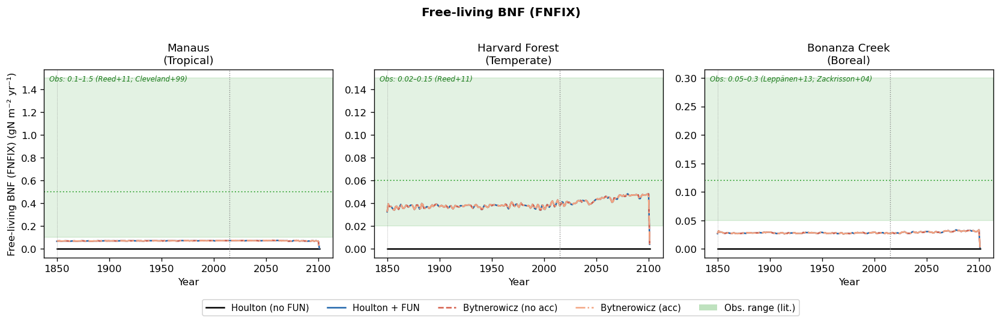

In [67]:

# Scale to gN m-2 yr-1 for readability; refs in gN m-2 yr-1
plot_var_3sites('NFIX',          'gN m⁻² yr⁻¹', 'Total BNF (TNFIX)',
                scale=1e3, refs=LIT_BNF_TOTAL)
plot_var_3sites('NFIX_TO_SMINN', 'gN m⁻² yr⁻¹', 'Symbiotic BNF (SNFIX)',
                scale=1e3, refs=LIT_BNF_SYMBIOTIC)
plot_var_3sites('FFIX_TO_SMINN', 'gN m⁻² yr⁻¹', 'Free-living BNF (FNFIX)',
                scale=1e3, refs=LIT_BNF_FREELIVING)


### 4.3b BNF Deep Dive — Component Breakdown and Ratios

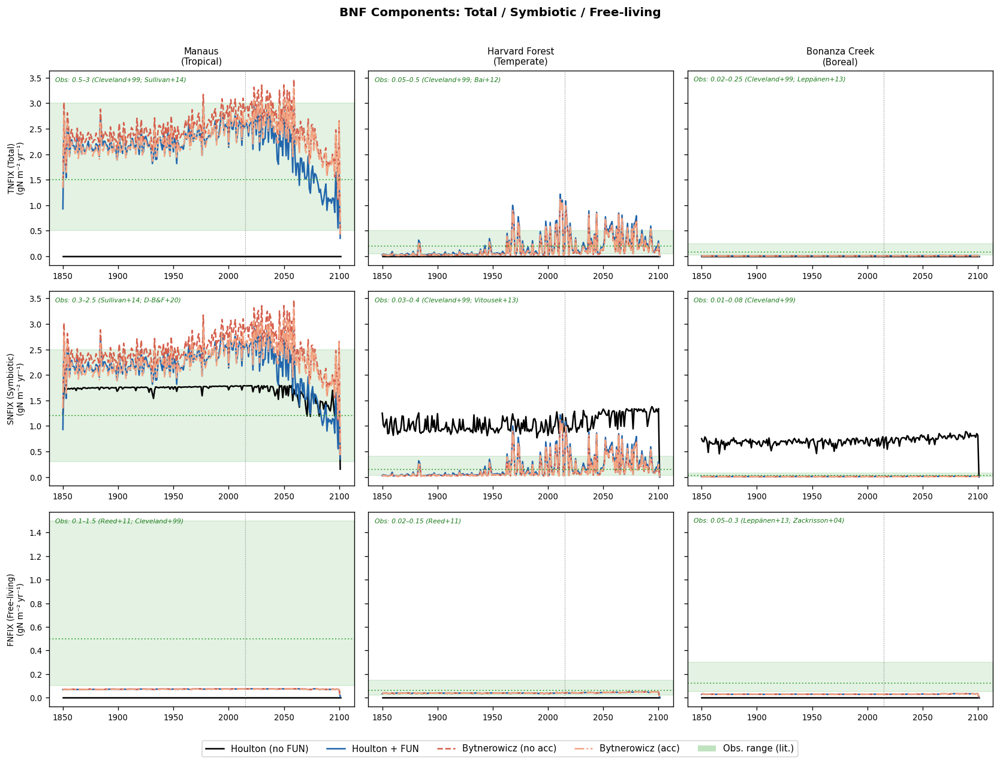

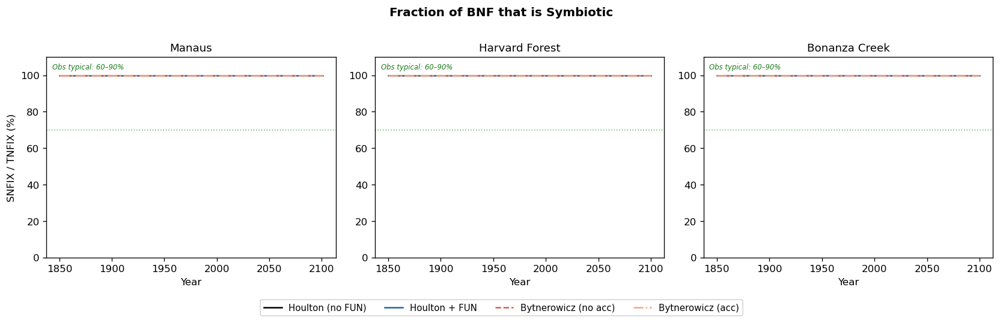

In [68]:

# ── BNF Focus Figure ────────────────────────────────────────────────────────
# 3 sites × 3 components (TNFIX / SNFIX / FNFIX) in one 3×3 grid.
# Literature bounds drawn as green horizontal bands.

BNF_VARS = [
    ('NFIX',          'TNFIX (Total)',      LIT_BNF_TOTAL),
    ('NFIX_TO_SMINN', 'SNFIX (Symbiotic)',  LIT_BNF_SYMBIOTIC),
    ('FFIX_TO_SMINN', 'FNFIX (Free-living)',LIT_BNF_FREELIVING),
]

fig, axes = plt.subplots(3, 3, figsize=(14, 10), sharey='row')
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

for row, (var, title_row, lit_ref) in enumerate(BNF_VARS):
    for col, site in enumerate(SITES):
        ax = axes[row, col]
        for exp, einfo in EXPS.items():
            ds = DATA[site].get(exp)
            if ds is None:
                continue
            try:
                da_ann = annual_sum(ds, var)
                years = da_ann.time.dt.year.values
                ax.plot(years, da_ann.values * 1e3,
                        color=einfo['color'], ls=einfo['ls'], lw=1.5)
            except Exception as e:
                pass
        # Reference band
        if site in lit_ref:
            r = lit_ref[site]
            ax.axhspan(r['lo'], r['hi'], alpha=0.13, color='#2ca02c', zorder=0)
            if 'central' in r:
                ax.axhline(r['central'], color='#2ca02c', lw=1.2, ls=':', alpha=0.8)
            ax.text(0.02, 0.97, f"Obs: {r['lo']:.2g}–{r['hi']:.2g} ({r['source']})",
                    transform=ax.transAxes, fontsize=6.5, va='top',
                    color='#1a7a1a', style='italic')
        ax.axvline(2015, color='grey', lw=0.7, ls=':')
        if row == 0:
            ax.set_title(f'{site}\n({SITES[site]["biome"]})', fontsize=9)
        if col == 0:
            ax.set_ylabel(f'{title_row}\n(gN m⁻² yr⁻¹)', fontsize=8)
        ax.tick_params(labelsize=8)

exp_handles = [Line2D([0],[0], color=e['color'], ls=e['ls'], lw=1.5, label=e['label'])
               for e in EXPS.values()]
exp_handles.append(Patch(fc='#2ca02c', alpha=0.3, label='Obs. range (lit.)'))
fig.legend(handles=exp_handles, loc='lower center', ncol=5,
           bbox_to_anchor=(0.5, -0.04), fontsize=9)
fig.suptitle('BNF Components: Total / Symbiotic / Free-living', fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('bnfmip_bnf_breakdown.png', bbox_inches='tight')
plt.show()

# ── SNFIX fraction of TNFIX ─────────────────────────────────────────────────
fig2, axes2 = plt.subplots(1, 3, figsize=(14, 4), sharey=False)
for ax, site in zip(axes2, SITES):
    for exp, einfo in EXPS.items():
        ds = DATA[site].get(exp)
        if ds is None:
            continue
        try:
            tnfix = annual_sum(ds, 'NFIX')
            snfix = annual_sum(ds, 'NFIX_TO_SMINN')
            frac  = snfix / tnfix.where(tnfix > 1e-10)
            years = frac.time.dt.year.values
            ax.plot(years, frac.values * 100,
                    color=einfo['color'], ls=einfo['ls'], lw=1.5, label=einfo['label'])
        except Exception:
            pass
    ax.axhline(70, color='#2ca02c', lw=1.0, ls=':', alpha=0.7)
    ax.text(0.02, 0.97, 'Obs typical: 60–90%', transform=ax.transAxes,
            fontsize=7, va='top', color='#1a7a1a', style='italic')
    ax.set_title(f'{site}')
    ax.set_xlabel('Year')
    ax.set_ylim(0, 110)
axes2[0].set_ylabel('SNFIX / TNFIX (%)')
handles2 = [Line2D([0],[0], color=e['color'], ls=e['ls'], lw=1.5, label=e['label'])
            for e in EXPS.values()]
fig2.legend(handles=handles2, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.08))
fig2.suptitle('Fraction of BNF that is Symbiotic', fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('bnfmip_snfix_fraction.png', bbox_inches='tight')
plt.show()


### 4.4 Nitrogen Fluxes

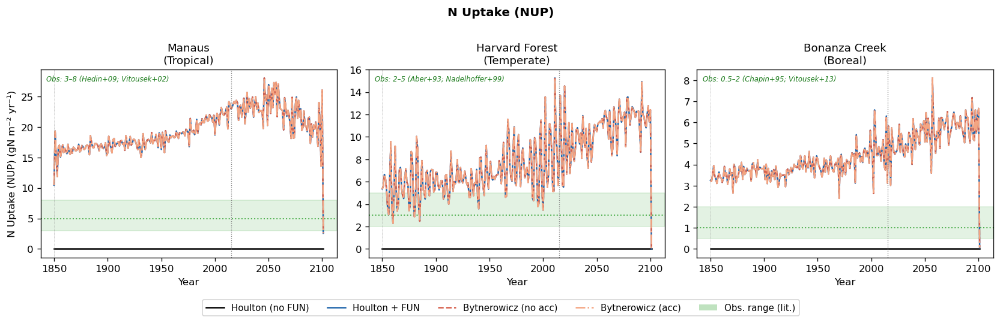

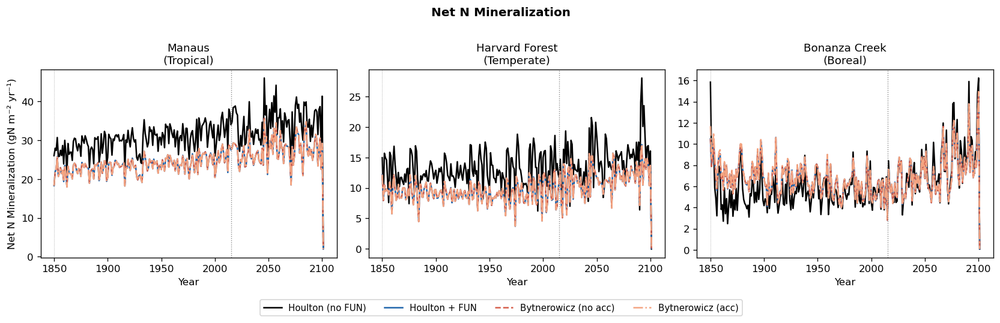

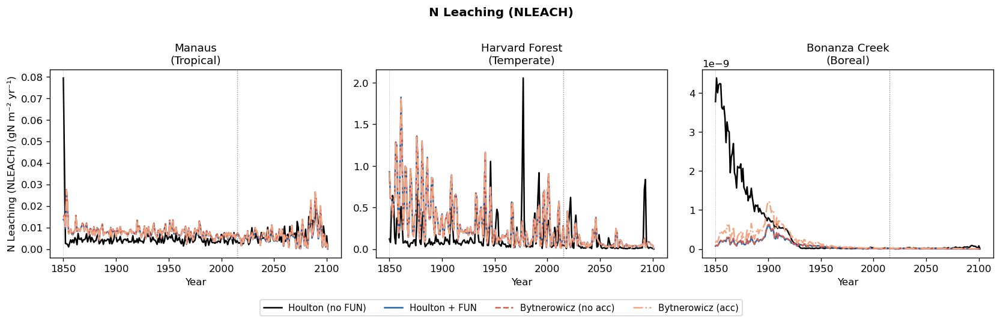

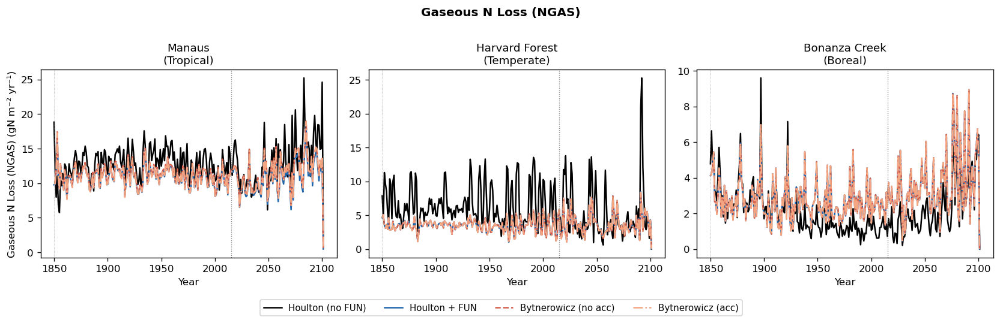

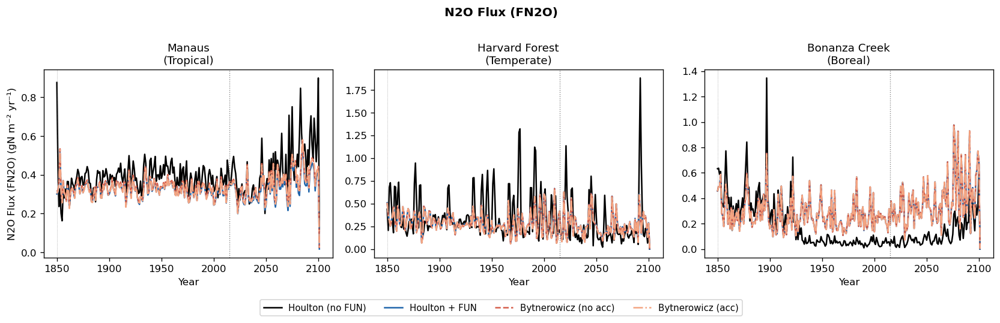

In [69]:

plot_var_3sites('NUPTAKE',        'gN m⁻² yr⁻¹', 'N Uptake (NUP)',         scale=1e3,
                refs=LIT_NUPTAKE)
plot_var_3sites('NET_NMIN',       'gN m⁻² yr⁻¹', 'Net N Mineralization',   scale=1e3)
plot_var_3sites('SMIN_NO3_LEACHED','gN m⁻² yr⁻¹','N Leaching (NLEACH)',    scale=1e3)

# NGAS = total gaseous N loss
plot_var_3sites(
    None, 'gN m⁻² yr⁻¹', 'Gaseous N Loss (NGAS)', scale=1e3,
    derived=lambda ds: ds['F_DENIT'] + ds['F_N2O_DENIT'] + ds['F_N2O_NIT']
)

# FN2O
plot_var_3sites(
    None, 'gN m⁻² yr⁻¹', 'N2O Flux (FN2O)', scale=1e3,
    derived=lambda ds: ds['F_N2O_DENIT'] + ds['F_N2O_NIT']
)


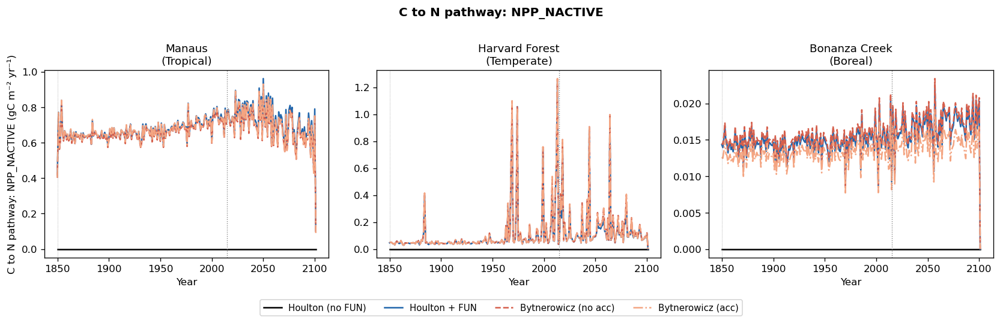

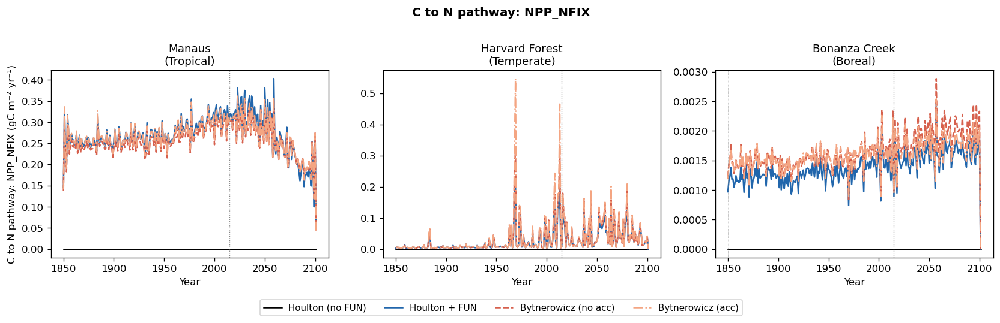

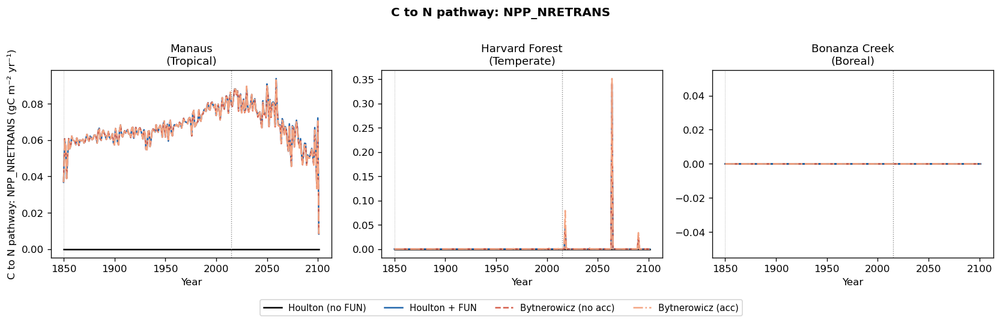

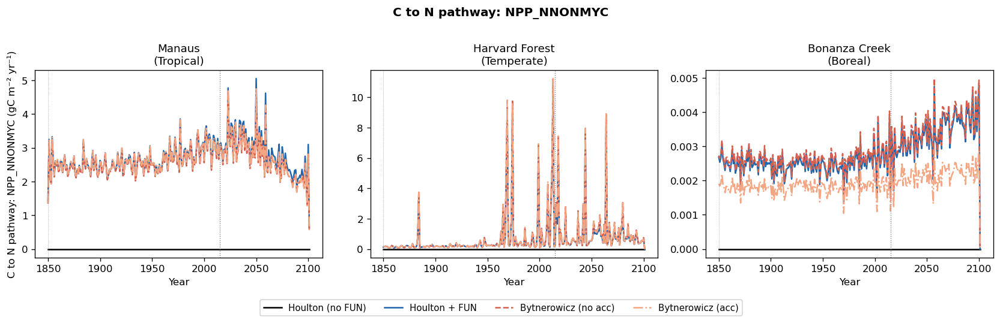

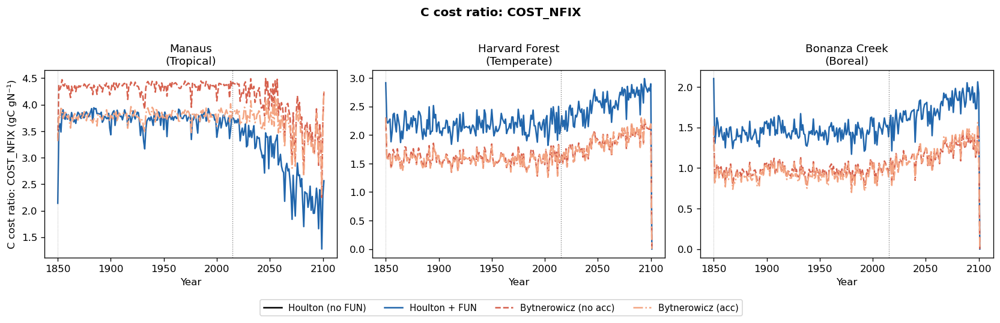

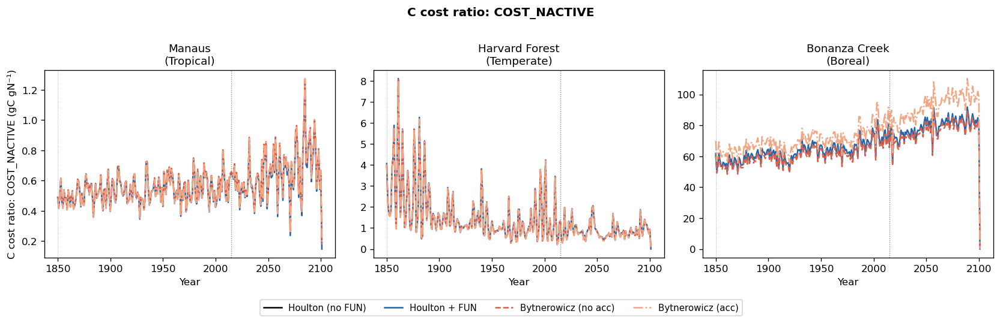

In [70]:
# ── N Uptake Pathway Breakdown (FUN diagnostics) ────────────────────────────────────────────
# NOTE on variable meanings:
#   NPP_NACTIVE   = gC m⁻² yr⁻¹ allocated to active (mycorrhizal/enzyme) N uptake
#   NPP_NFIX      = gC m⁻² yr⁻¹ allocated to symbiotic N fixation
#   NPP_NRETRANS  = gC m⁻² yr⁻¹ 'saved' by retranslocation (internal recycling)
#   NPP_NNONMYC   = gC m⁻² yr⁻¹ allocated to non-mycorrhizal passive N uptake
#   COST_NFIX / COST_NACTIVE = gC/gN (DIMENSIONLESS ratios, NOT per-area fluxes)
#     → plot these with flux=False, scale=1.0 to see the C-cost efficiency

# C allocation to each N pathway (gC m⁻² yr⁻¹)
for v in ['NPP_NACTIVE', 'NPP_NFIX', 'NPP_NRETRANS', 'NPP_NNONMYC']:
    plot_var_3sites(v, 'gC m⁻² yr⁻¹', f'C to N pathway: {v}', scale=1e3)

# C-cost per gN acquired (dimensionless gC/gN) – flux=False to avoid time integration
for v in ['COST_NFIX', 'COST_NACTIVE']:
    plot_var_3sites(v, 'gC gN⁻¹', f'C cost ratio: {v}', flux=False, scale=1.0)


In [71]:

# Protocol variables → ELM variable names
# Monthly h0 output
VARS_MONTHLY = [
    # Physical
    'TSOI',          # soil temperature (all layers)
    'TSOI_10CM',     # 10-cm mean soil temperature (proxy for TSOIBNF)
    'ELAI',
    # Hydrology
    'H2OSOI',
    'QVEGT',         # transpiration (TVEG)
    'EFLX_LH_TOT',   # latent heat total (ET proxy)
    # C fluxes
    'GPP', 'AR', 'HR', 'NPP',
    'LEAFC_TO_LITTER',   # part of VEGC_TO_LITTER
    'LITFALL',           # total litter C flux
    'LITHR',             # litter HR
    'SOILC_HR',          # soil C HR
    # N fluxes
    'NFIX',              # total BNF
    'NFIX_TO_SMINN',     # symbiotic BNF
    'FFIX_TO_SMINN',     # free-living BNF
    'NET_NMIN',
    'NUPTAKE',
    'SMIN_NO3_LEACHED',
    'F_DENIT',
    'F_N2O_DENIT', 'F_N2O_NIT',
    # P fluxes
    'NET_PMIN',
    'PUPTAKE',
    'SMINP_LEACHED',
    # Cost variables (FUN-specific)
    'COST_NFIX', 'COST_NACTIVE', 'COST_NRETRANS', 'COST_NNONMYC',
    'COST_PACTIVE', 'COST_PRETRANS', 'COST_PNONMYC',
    # N uptake pathways (FUN)
    'NPP_NFIX', 'NPP_NACTIVE', 'NPP_NRETRANS', 'NPP_NNONMYC',
]

# Annual (from h0 annual-average or directly computed)
VARS_POOLS = [
    'TOTVEGC', 'TOTECOSYSC', 'TOTVEGC_ABG',
    'TOTLITC', 'SOILC', 'TOTSOMC',
    'LEAFC', 'WOODC', 'FROOTC', 'DEADCROOTC', 'LIVECROOTC', 'CWDC',
    'STORVEGC', 'CPOOL',
    'TOTVEGN', 'TOTECOSYSN',
    'SMINN', 'TOTLITN', 'TOTSOMN',
    'LEAFN', 'CWDN', 'FROOTN', 'DEADCROOTN', 'LIVECROOTN',
    'TOTVEGP', 'TOTECOSYSP',
    'SMINP', 'TOTLITP', 'TOTSOMP',
    'LEAFP', 'CWDP', 'FROOTP',
    'RETRANSN', 'RETRANSP',
]

ALL_VARS = list(set(VARS_MONTHLY + VARS_POOLS))


def load_case(exp, site_info, variables=None):
    """
    Load all h0 files for one case into a single xarray.Dataset.
    Uses xr.open_dataset per file + xr.concat (no dask required).
    Squeezes spatial dims (single-point runs). Returns Dataset indexed by time.
    """
    cname = case_name(exp, site_info)
    rdir  = run_dir(exp, site_info)
    files = sorted(glob.glob(os.path.join(rdir, f'{cname}.clm2.h0.*.nc')))
    if not files:
        raise FileNotFoundError(f'No h0 files found: {rdir}')

    # Filter to variables that actually exist in the first file
    if variables is not None:
        import netCDF4 as nc_
        with nc_.Dataset(files[0]) as f:
            available = set(f.variables.keys())
        variables = [v for v in variables if v in available]

    datasets = []
    for f in files:
        ds_i = xr.open_dataset(f, engine='netcdf4', decode_times=True)
        if variables is not None:
            ds_i = ds_i[variables]
        datasets.append(ds_i)
    ds = xr.concat(datasets, dim='time')

    # Single-point runs: squeeze lat/lon
    for dim in ['lat', 'lon', 'lndgrid']:
        if dim in ds.dims and ds.dims[dim] == 1:
            ds = ds.squeeze(dim)
    return ds


def annual_mean(ds, var):
    """Annual mean of a monthly variable (pools, temperatures, ratios)."""
    return ds[var].resample(time='1Y').mean()


def annual_sum(ds, var):
    """Annual integral of a monthly-mean flux.

    ELM h0 fluxes are stored as gX m⁻² s⁻¹ (per-second rates).
    Multiply by days_in_month (days) × 86400 (s/day) → gX m⁻²/month,
    then sum 12 months → gX m⁻²/yr, divided by 1000 → kgX m⁻²/yr.
    With scale=1e3 in the plot call this gives gX m⁻²/yr on the axis.
    """
    days = ds.time.dt.days_in_month
    flux_monthly = ds[var] * days * 86400 * 1e-3  # kgX m⁻²/month
    return flux_monthly.resample(time='1Y').sum()  # kgX m⁻²/yr


print('Loading functions defined. Loading data...')


Loading functions defined. Loading data...


In [82]:
finidat = '.../ACC_BNF-Bon_I20TRCNPRDCTCBC/run/...2015-01-01-00000.nc'
DATM_CO2_TSERIES = none   ← CO2 fixed
use_funp = .true.          ← fpg_p bug active

SyntaxError: invalid character '←' (U+2190) (3289224218.py, line 2)

### 4.5 Nitrogen Pools

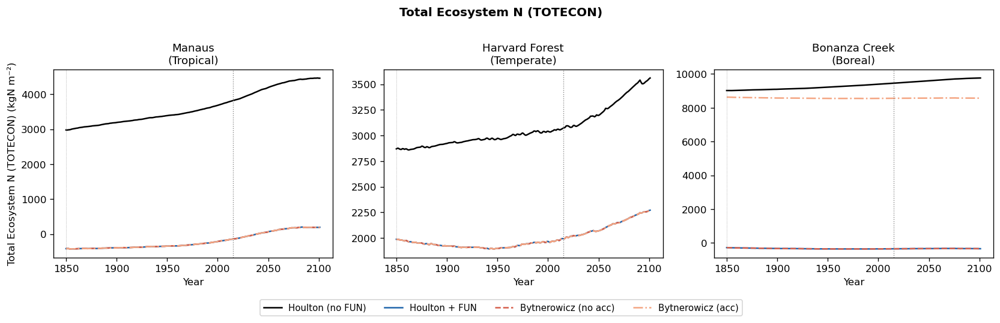

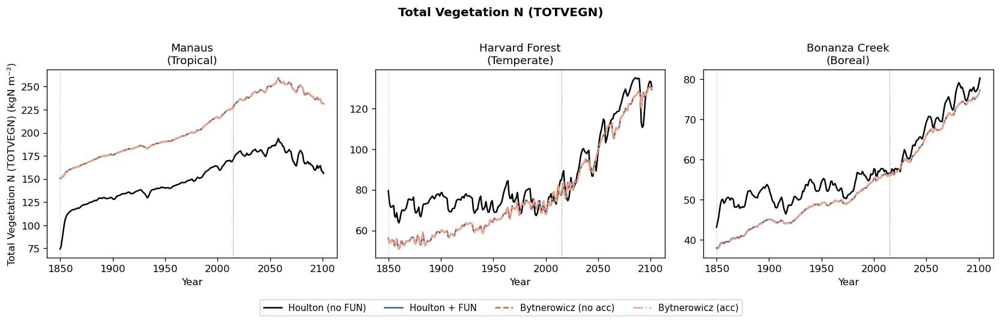

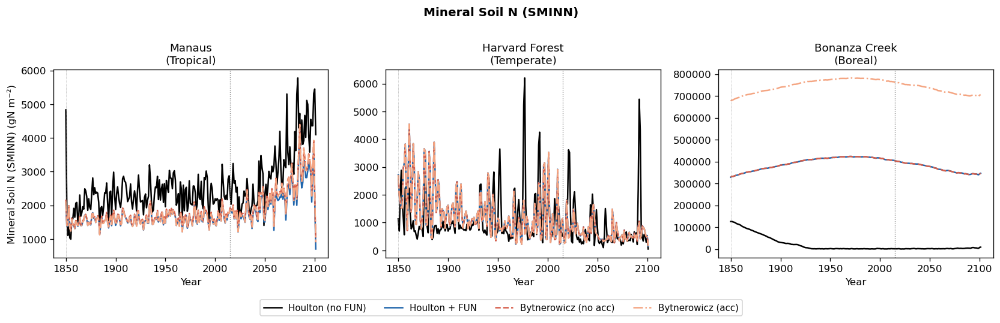

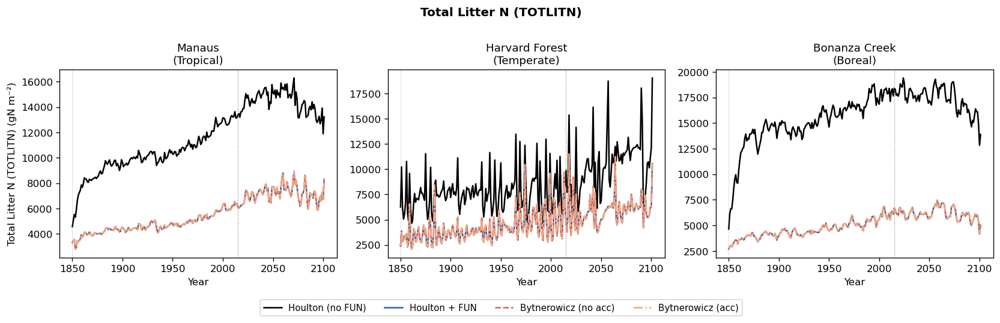

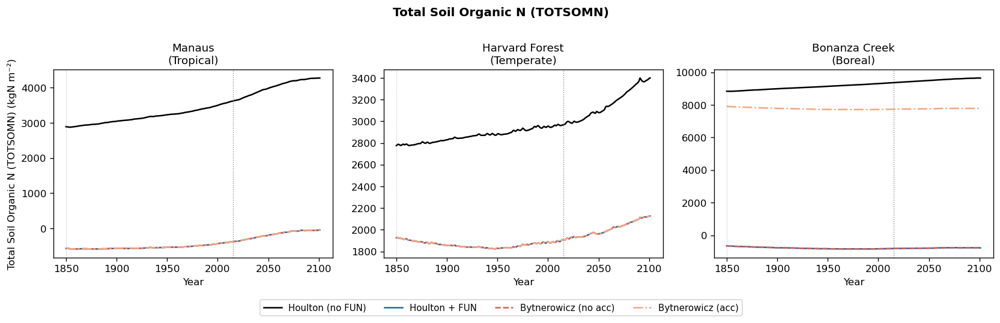

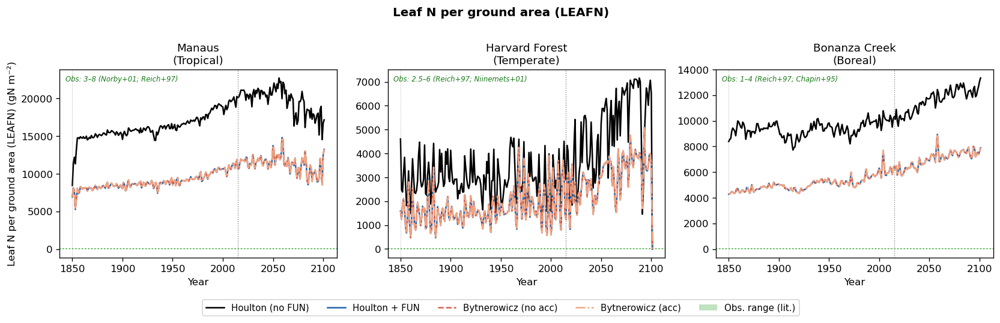

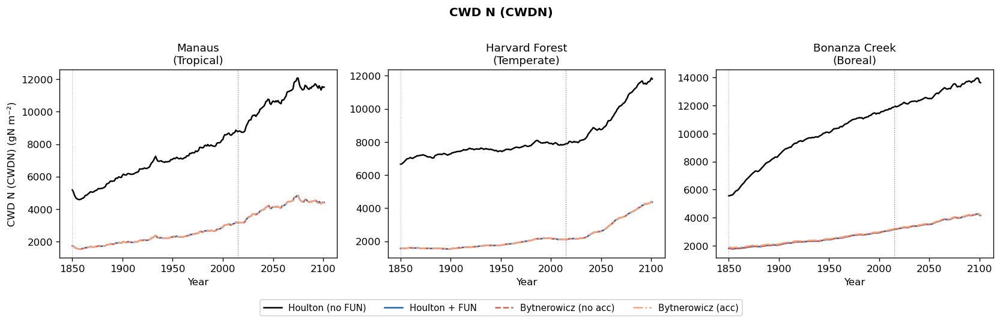

In [80]:
plot_var_3sites('TOTECOSYSN', 'kgN m⁻²', 'Total Ecosystem N (TOTECON)', flux=False)
plot_var_3sites('TOTVEGN',    'kgN m⁻²', 'Total Vegetation N (TOTVEGN)', flux=False)
plot_var_3sites('SMINN',      'gN m⁻²',  'Mineral Soil N (SMINN)', flux=False, scale=1e3)
plot_var_3sites('TOTLITN',    'gN m⁻²',  'Total Litter N (TOTLITN)', flux=False, scale=1e3)
plot_var_3sites('TOTSOMN',    'kgN m⁻²', 'Total Soil Organic N (TOTSOMN)', flux=False)
plot_var_3sites('LEAFN',      'gN m⁻²',  'Leaf N per ground area (LEAFN)', flux=False, scale=1e3, refs=LIT_LEAFN)
plot_var_3sites('CWDN',       'gN m⁻²',  'CWD N (CWDN)', flux=False, scale=1e3)

### 4.6 Phosphorus Pools and Fluxes

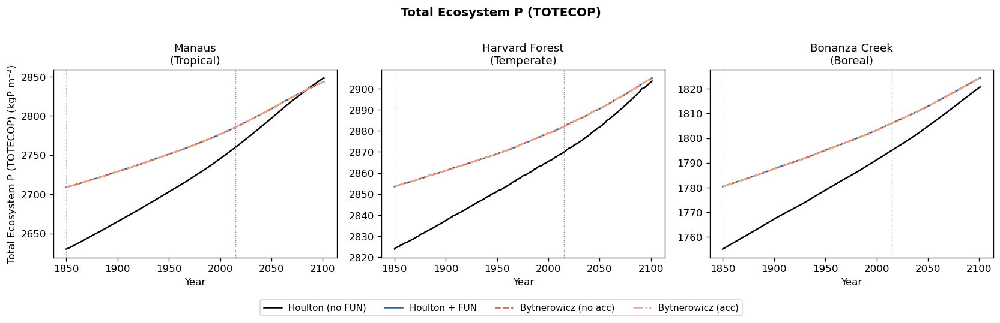

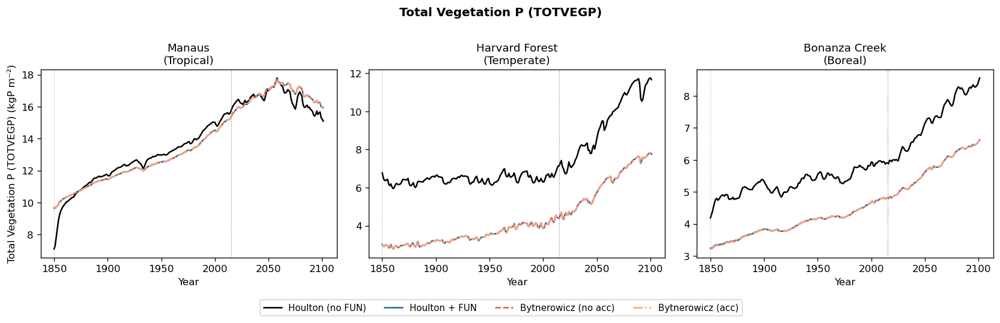

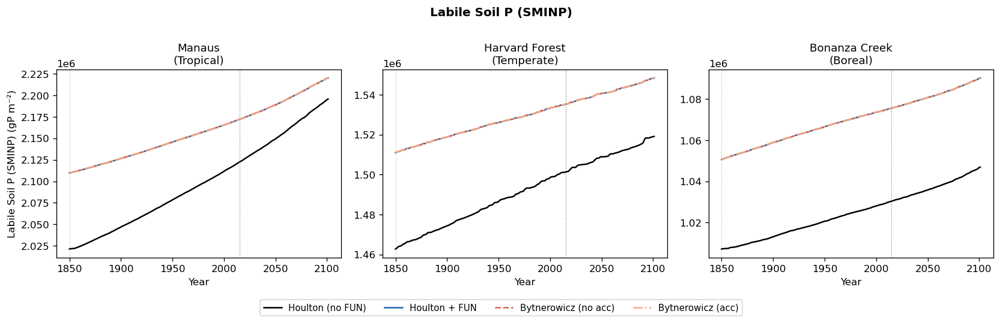

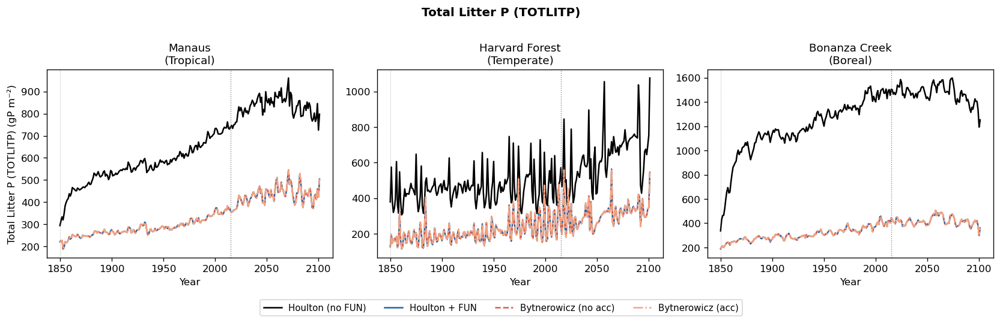

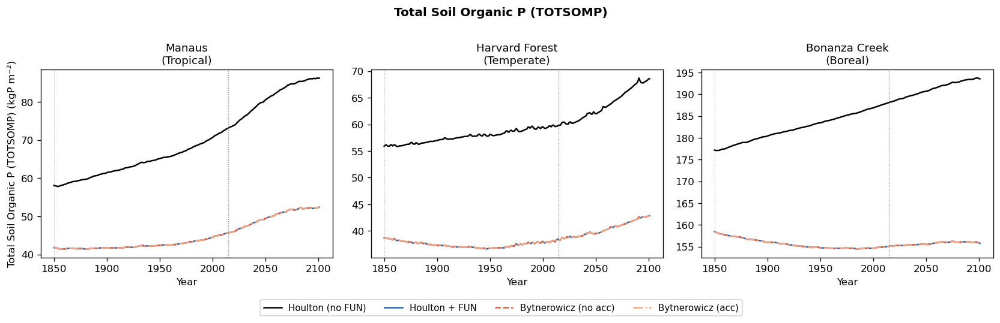

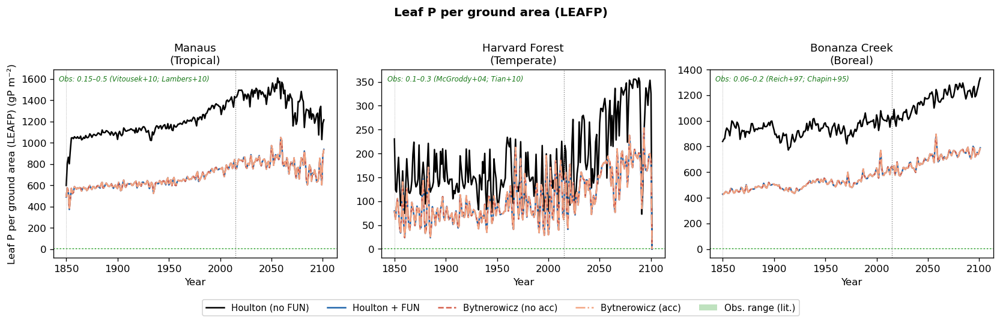

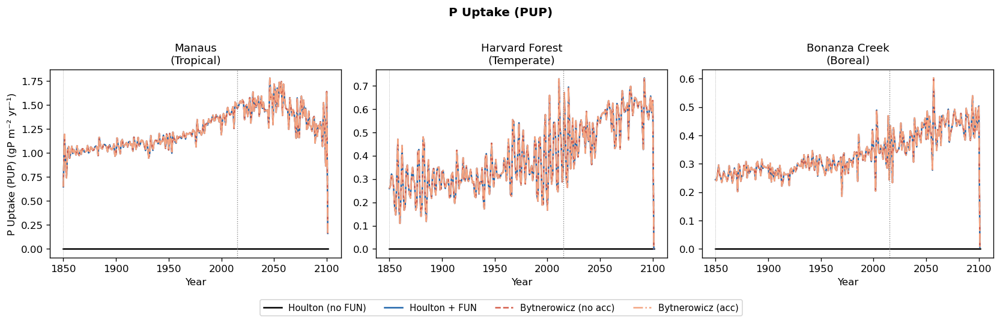

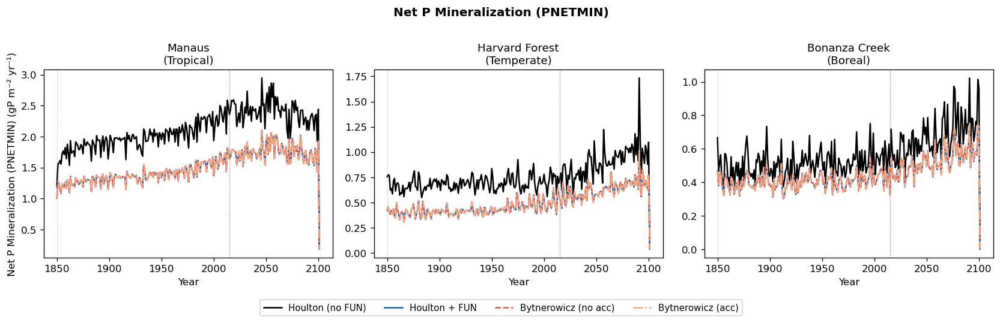

In [81]:
plot_var_3sites('TOTECOSYSP', 'kgP m⁻²', 'Total Ecosystem P (TOTECOP)', flux=False)
plot_var_3sites('TOTVEGP',    'kgP m⁻²', 'Total Vegetation P (TOTVEGP)', flux=False)
plot_var_3sites('SMINP',      'gP m⁻²',  'Labile Soil P (SMINP)', flux=False, scale=1e3)
plot_var_3sites('TOTLITP',    'gP m⁻²',  'Total Litter P (TOTLITP)', flux=False, scale=1e3)
plot_var_3sites('TOTSOMP',    'kgP m⁻²', 'Total Soil Organic P (TOTSOMP)', flux=False)
plot_var_3sites('LEAFP',      'gP m⁻²',  'Leaf P per ground area (LEAFP)', flux=False, scale=1e3, refs=LIT_LEAFP)
plot_var_3sites('PUPTAKE',    'gP m⁻² yr⁻¹', 'P Uptake (PUP)', scale=1e3)
plot_var_3sites('NET_PMIN',   'gP m⁻² yr⁻¹', 'Net P Mineralization (PNETMIN)', scale=1e3)

### 4.7 Physical and Structural Variables

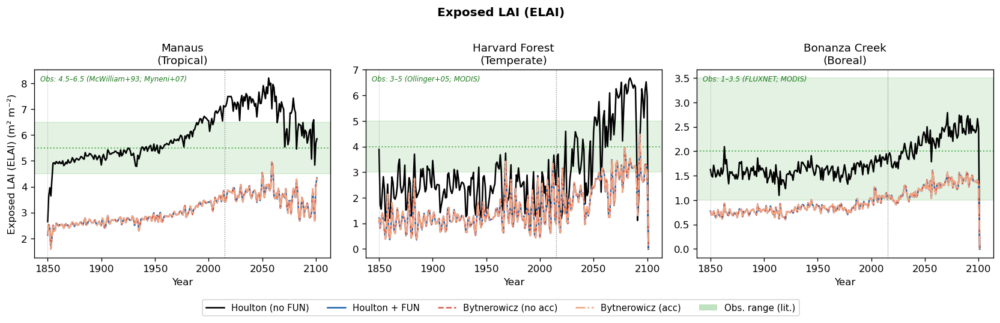

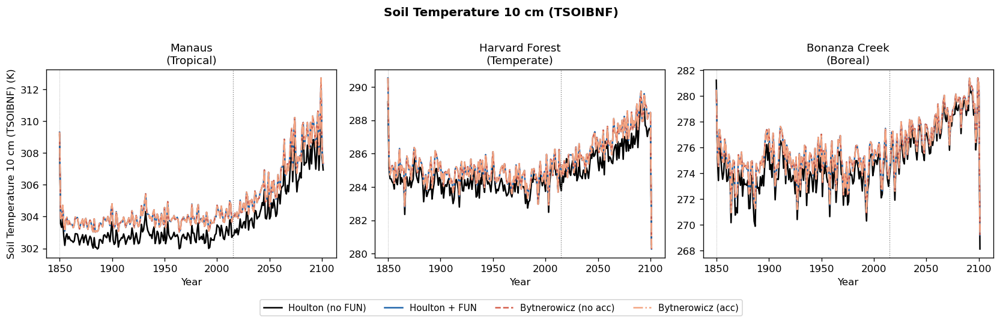

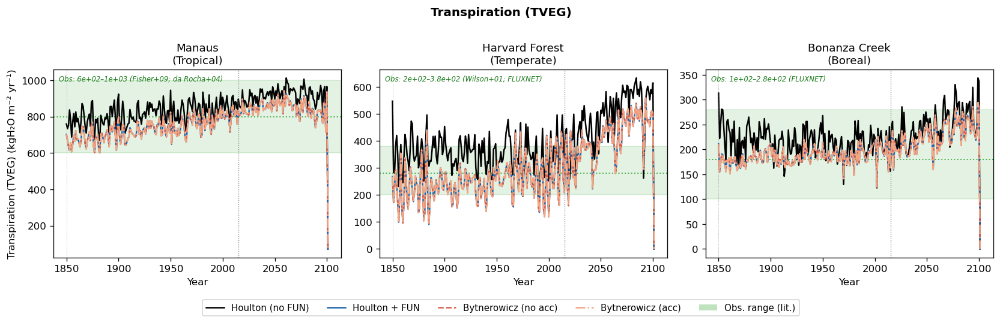

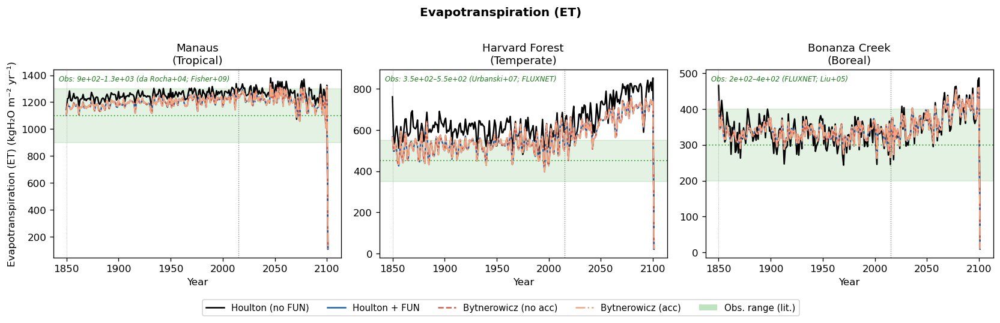

In [73]:

plot_var_3sites('ELAI',      'm² m⁻²', 'Exposed LAI (ELAI)', flux=False, refs=LIT_ELAI)
plot_var_3sites('TSOI_10CM', 'K',      'Soil Temperature 10 cm (TSOIBNF)', flux=False)

# QVEGT is in mm s⁻¹; annual_sum treats values as gX m⁻² s⁻¹ so
# multiply by 1e3 (mm→g equivalent) to get kgH₂O m⁻² yr⁻¹ correctly.
plot_var_3sites('QVEGT', 'kgH₂O m⁻² yr⁻¹', 'Transpiration (TVEG)', scale=1e3, refs=LIT_TVEG)

# ET from latent heat: EFLX_LH_TOT [W m⁻²] / L_v [J g⁻¹ H₂O] = gH₂O m⁻² s⁻¹
# annual_sum then integrates to kgH₂O m⁻² yr⁻¹ with scale=1.0
plot_var_3sites(
    None, 'kgH₂O m⁻² yr⁻¹', 'Evapotranspiration (ET)',
    derived=lambda ds: ds['EFLX_LH_TOT'] / 2501.0,
    refs=LIT_ET,
)


## 5. FUN Cost Diagnostics

Carbon costs of N acquisition pathways — ELM-FUN specific.

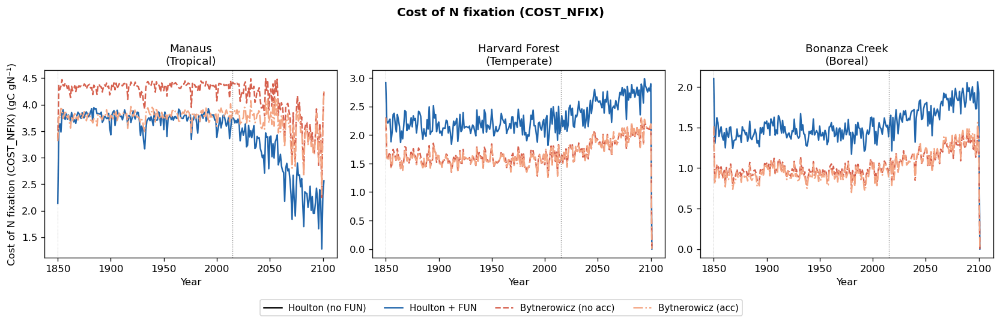

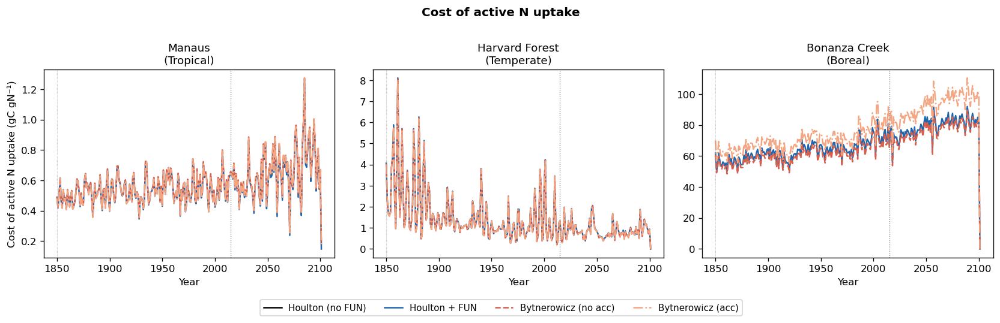

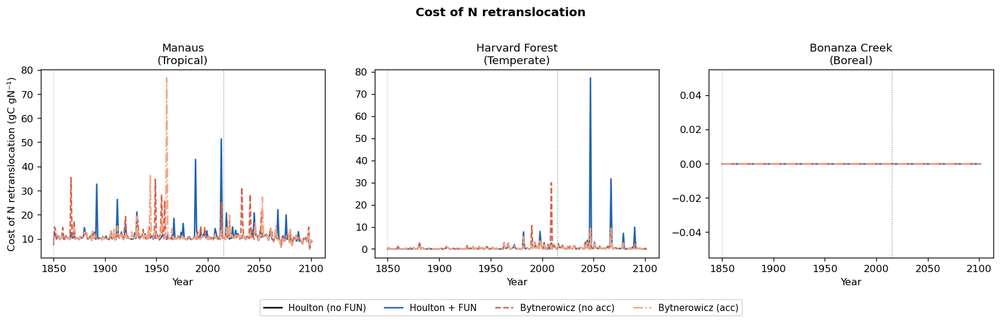

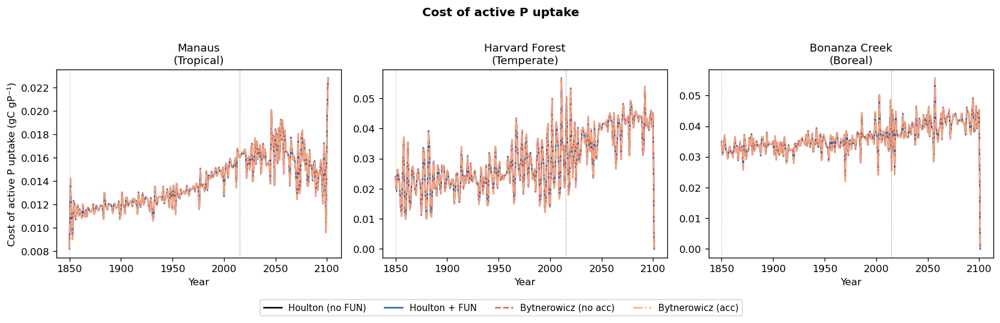

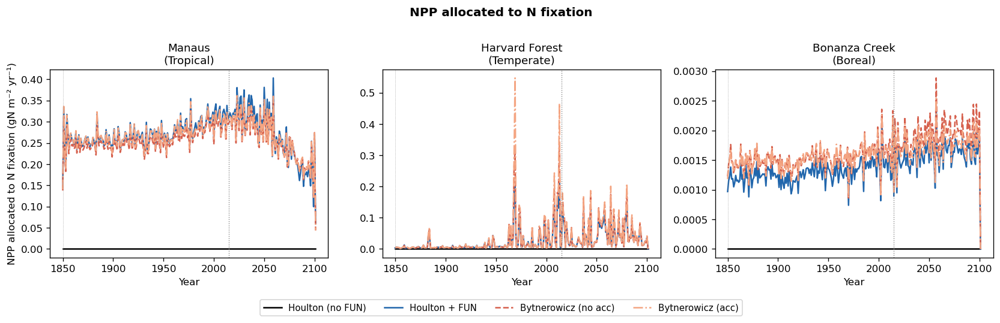

In [74]:
plot_var_3sites('COST_NFIX',     'gC gN⁻¹', 'Cost of N fixation (COST_NFIX)',     flux=False)
plot_var_3sites('COST_NACTIVE',  'gC gN⁻¹', 'Cost of active N uptake',             flux=False)
plot_var_3sites('COST_NRETRANS', 'gC gN⁻¹', 'Cost of N retranslocation',           flux=False)
plot_var_3sites('COST_PACTIVE',  'gC gP⁻¹', 'Cost of active P uptake',             flux=False)

# Fraction of N obtained via fixation vs. other pathways
plot_var_3sites('NPP_NFIX',      'gN m⁻² yr⁻¹', 'NPP allocated to N fixation', scale=1e3)

## 6. Comparison by Time Period

Evaluate protocol time points: pre-industrial (1840–1860), current (2005–2015), end-of-century (2090–2100).

In [75]:
PERIODS = {
    '1850 PI':  slice('1840', '1860'),
    '2015':     slice('2010', '2020'),
    '2100 SSP585': slice('2090', '2100'),
}

KEY_VARS = {
    'NPP':             ('kgC m⁻² yr⁻¹', True,  1.0),
    'GPP':             ('kgC m⁻² yr⁻¹', True,  1.0),
    'TOTECOSYSC':      ('kgC m⁻²',      False, 1.0),
    'TOTVEGC':         ('kgC m⁻²',      False, 1.0),
    'TOTECOSYSN':      ('kgN m⁻²',      False, 1.0),
    'NFIX':            ('gN m⁻² yr⁻¹', True,  1e3),
    'NFIX_TO_SMINN':   ('gN m⁻² yr⁻¹', True,  1e3),
    'TSOI_10CM':       ('K',            False, 1.0),
}

rows = []
for site in SITES:
    for exp in EXPS:
        ds = DATA[site].get(exp)
        if ds is None:
            continue
        for period, tslice in PERIODS.items():
            row = {'Site': site, 'Experiment': exp, 'Period': period}
            for var, (unit, flux, scale) in KEY_VARS.items():
                try:
                    if flux:
                        da = annual_sum(ds, var).sel(time=tslice).mean().values
                    else:
                        da = annual_mean(ds, var).sel(time=tslice).mean().values
                    row[f'{var} ({unit})'] = float(da) * scale
                except Exception:
                    row[f'{var} ({unit})'] = np.nan
            rows.append(row)

df = pd.DataFrame(rows)
df['Experiment_label'] = df['Experiment'].map({k: v['label'] for k, v in EXPS.items()})

# Display summary for 2015 period
print('=== Year ~2015 summary ===')
display(df[df['Period'] == '2015'].drop(columns='Experiment').set_index(
    ['Site', 'Experiment_label']
).round(4))

=== Year ~2015 summary ===


Period  NPP (kgC m⁻² yr⁻¹)  \
Site           Experiment_label                                  
Manaus         Houlton (no FUN)       2015              1.6123   
               Houlton + FUN          2015              0.9173   
               Bytnerowicz (no acc)   2015              0.9173   
               Bytnerowicz (acc)      2015              0.9173   
Harvard Forest Houlton (no FUN)       2015              0.6959   
               Houlton + FUN          2015              0.3494   
               Bytnerowicz (no acc)   2015              0.3488   
               Bytnerowicz (acc)      2015              0.3489   
Bonanza Creek  Houlton (no FUN)       2015              0.4622   
               Houlton + FUN          2015              0.2430   
               Bytnerowicz (no acc)   2015              0.2430   
               Bytnerowicz (acc)      2015              0.2430   

                                     GPP (kgC m⁻² yr⁻¹)  TOTECOSYSC (kgC m⁻²)  \
Site           Experiment_label                                                 
Manaus         Houlton (no FUN)                  3.8954            66637.5043   
               Houlton + FUN                     3.5735            38166.2781   
               Bytnerowicz (no acc)              3.5735            38167.3668   
               Bytnerowicz (acc)                 3.5735            38164.3963   
Harvard Forest Houlton (no FUN)                  1.2141            48351.9940   
               Houlton + FUN                     1.0122            25598.7527   
               Bytnerowicz (no acc)              1.0113            25591.2798   
               Bytnerowicz (acc)                 1.0114            25591.6326   
Bonanza Creek  Houlton (no FUN)                  0.9681           111471.1591   
               Houlton + FUN                     0.9073            84222.4588   
               Bytnerowicz (no acc)              0.9073            84211.1705   
               Bytnerowicz (acc)                 0.9072            84207.8949   

                                     TOTVEGC (kgC m⁻²)  TOTECOSYSN (kgN m⁻²)  \
Site           Experiment_label                                                
Manaus         Houlton (no FUN)             25418.8908             3817.1151   
               Houlton + FUN                13372.1841             -141.1182   
               Bytnerowicz (no acc)         13372.5600             -140.9250   
               Bytnerowicz (acc)            13372.3613             -141.2196   
Harvard Forest Houlton (no FUN)             14223.1110             3073.2624   
               Houlton + FUN                 5211.4975             1993.7312   
               Bytnerowicz (no acc)          5207.3843             1993.3377   
               Bytnerowicz (acc)             5207.6994             1993.3380   
Bonanza Creek  Houlton (no FUN)             10607.0852             9455.8699   
               Houlton + FUN                 4915.5262             -349.7717   
               Bytnerowicz (no acc)          4915.2132             -350.5621   
               Bytnerowicz (acc)             4914.9497             8563.6075   

                                     NFIX (gN m⁻² yr⁻¹)  \
Site           Experiment_label                           
Manaus         Houlton (no FUN)                  0.0000   
               Houlton + FUN                     2.5334   
               Bytnerowicz (no acc)              2.8968   
               Bytnerowicz (acc)                 2.6138   
Harvard Forest Houlton (no FUN)                  0.0000   
               Houlton + FUN                     0.5833   
               Bytnerowicz (no acc)              0.5307   
               Bytnerowicz (acc)                 0.5396   
Bonanza Creek  Houlton (no FUN)                  0.0000   
               Houlton + FUN                     0.0086   
               Bytnerowicz (no acc)              0.0068   
               Bytnerowicz (acc)                 0.0064   

                            

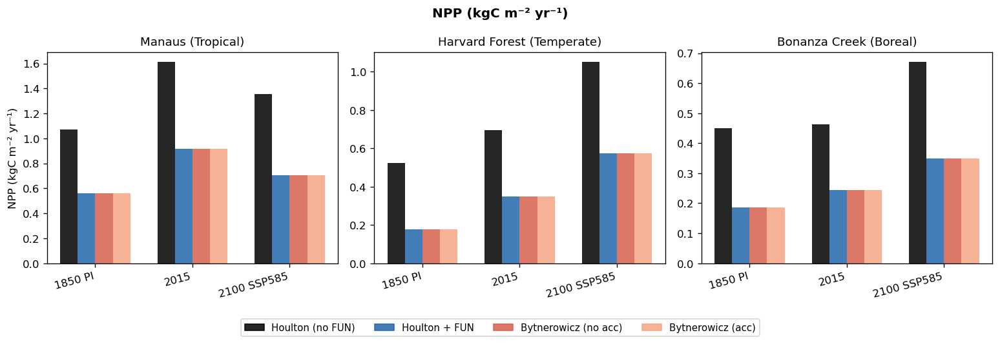

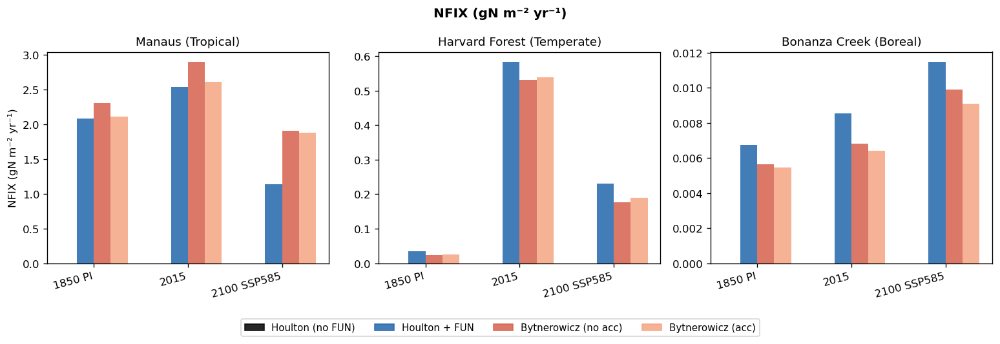

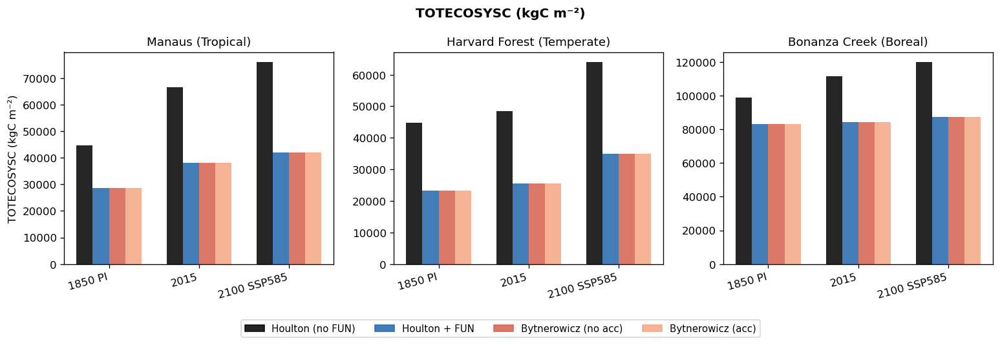

In [76]:
# Bar chart: key variables by experiment and period for each site
plot_vars = ['NPP (kgC m⁻² yr⁻¹)', 'NFIX (gN m⁻² yr⁻¹)', 'TOTECOSYSC (kgC m⁻²)']

for pvar in plot_vars:
    fig, axes = plt.subplots(1, 3, figsize=(13, 4), sharey=False)
    x = np.arange(len(PERIODS))
    width = 0.18
    for ax, site in zip(axes, SITES):
        sub = df[df['Site'] == site]
        for i, (exp, einfo) in enumerate(EXPS.items()):
            esub = sub[sub['Experiment'] == exp]
            vals = [esub[esub['Period'] == p][pvar].values[0]
                    if len(esub[esub['Period'] == p]) > 0 else np.nan
                    for p in PERIODS]
            ax.bar(x + i*width - 1.5*width, vals, width=width,
                   color=einfo['color'], label=einfo['label'], alpha=0.85)
        ax.set_xticks(x)
        ax.set_xticklabels(list(PERIODS.keys()), rotation=15, ha='right')
        ax.set_title(f'{site} ({SITES[site]["biome"]})')
    axes[0].set_ylabel(pvar)
    handles = [plt.Rectangle((0,0),1,1, color=e['color'], alpha=0.85, label=e['label'])
               for e in EXPS.values()]
    fig.legend(handles=handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.1))
    fig.suptitle(pvar, fontweight='bold')
    plt.tight_layout()
    safe = pvar.split('(')[0].strip().replace(' ', '_').lower()
    plt.savefig(f'bnfmip_bar_{safe}.png', bbox_inches='tight')
    plt.show()

## 7. Seasonal Cycles at Key Time Points

Mean monthly cycles of BNF, NPP, and soil temperature for the three protocol periods.

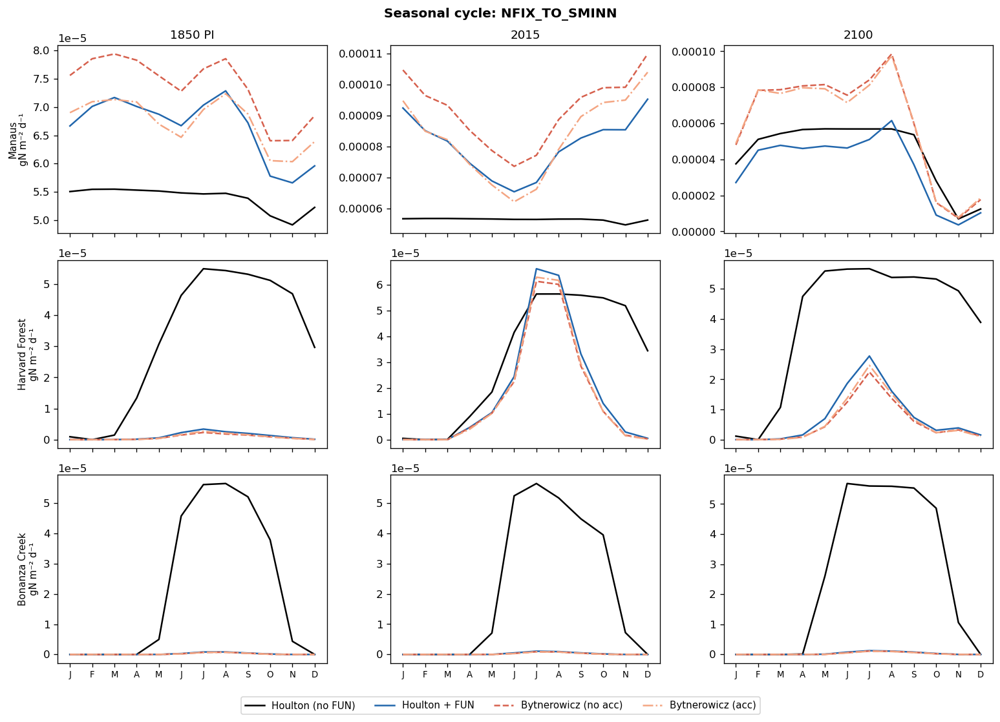

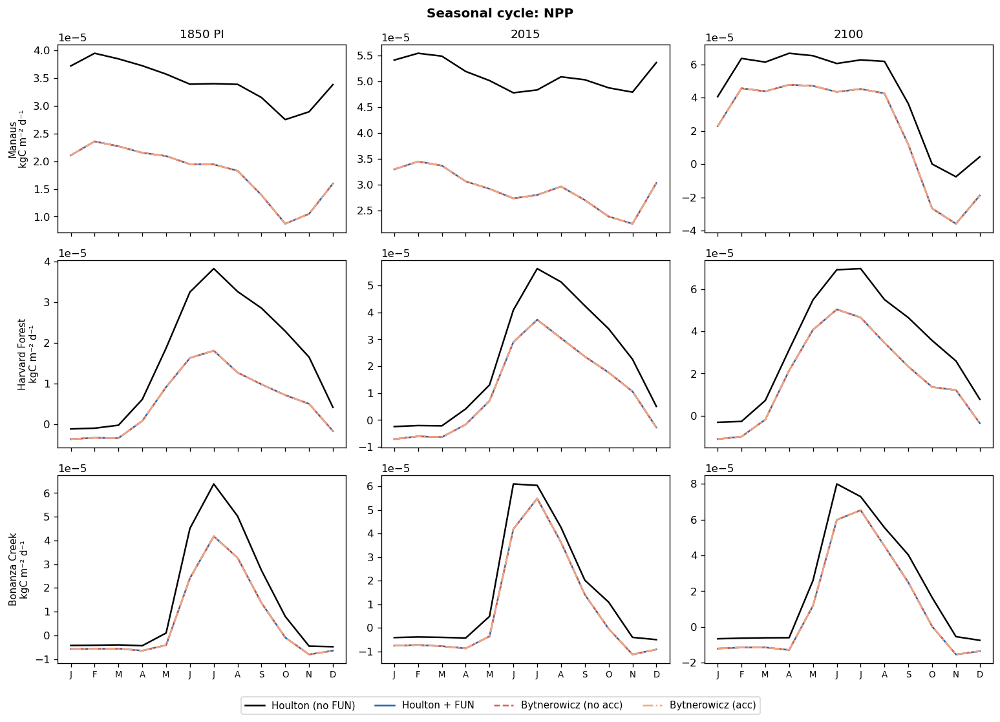

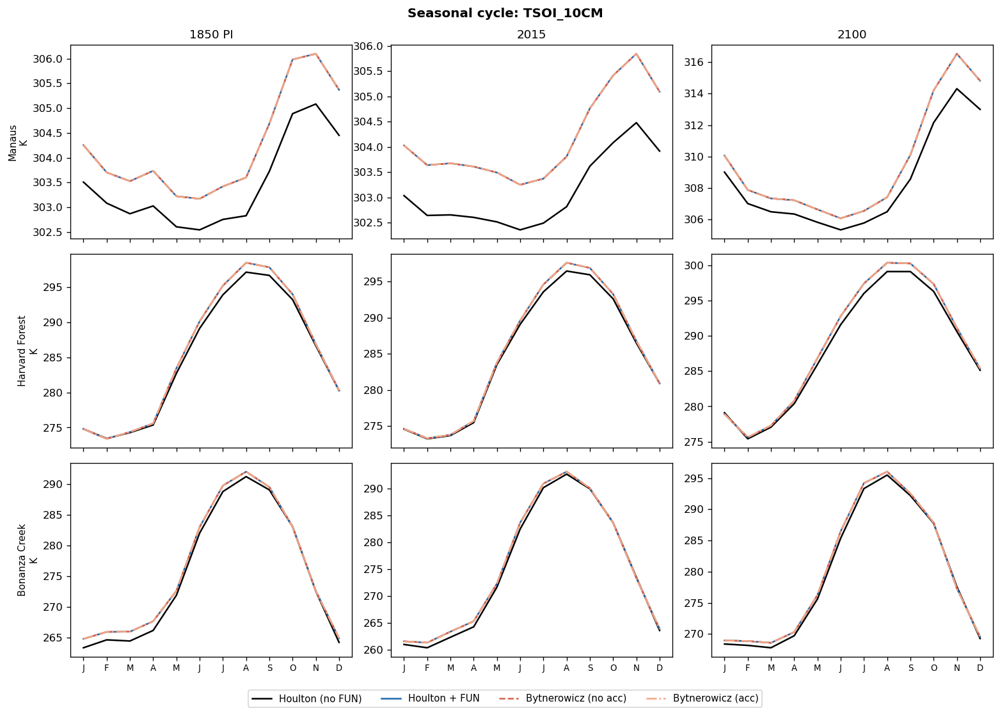

In [77]:
SEASONAL_PERIODS = {
    '1850 PI':   ('1840', '1860'),
    '2015':      ('2010', '2020'),
    '2100':      ('2090', '2100'),
}

MONTH_LABELS = ['J','F','M','A','M','J','J','A','S','O','N','D']

for sv in ['NFIX_TO_SMINN', 'NPP', 'TSOI_10CM']:
    flux = sv not in ['TSOI_10CM', 'ELAI']
    scale = 1e3 if 'NFIX' in sv or 'NUP' in sv else 1.0
    unit = 'gN m⁻² d⁻¹' if 'NFIX' in sv else ('kgC m⁻² d⁻¹' if sv == 'NPP' else 'K')

    fig, axes = plt.subplots(len(SITES), len(SEASONAL_PERIODS),
                             figsize=(13, 9), sharex=True)
    for row_i, site in enumerate(SITES):
        for col_j, (pname, (y0, y1)) in enumerate(SEASONAL_PERIODS.items()):
            ax = axes[row_i, col_j]
            for exp, einfo in EXPS.items():
                ds = DATA[site].get(exp)
                if ds is None or sv not in ds:
                    continue
                sub = ds[sv].sel(time=slice(y0, y1))
                # Skip empty time windows (experiment may not cover this period)
                if sub.sizes.get('time', 0) == 0:
                    continue
                if scale != 1.0:
                    sub = sub * scale
                # cftime objects are dtype=object; extract month via list comprehension
                months = np.array([t.month for t in sub.indexes['time']])
                month_da = xr.DataArray(months, coords={'time': sub.coords['time']}, dims=['time'])
                clim = sub.groupby(month_da).mean('time')
                ax.plot(np.arange(1,13), clim.values,
                        color=einfo['color'], ls=einfo['ls'],
                        lw=1.5, label=einfo['label'])
            ax.set_xticks(np.arange(1,13))
            ax.set_xticklabels(MONTH_LABELS, fontsize=8)
            if row_i == 0:
                ax.set_title(pname)
            if col_j == 0:
                ax.set_ylabel(f'{site}\n{unit}', fontsize=9)

    handles = [Line2D([0],[0], color=e['color'], ls=e['ls'], lw=1.5, label=e['label'])
               for e in EXPS.values()]
    fig.legend(handles=handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.04))
    fig.suptitle(f'Seasonal cycle: {sv}', fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'bnfmip_seasonal_{sv.lower()}.png', bbox_inches='tight')
    plt.show()


## 8. BNF vs. Soil Temperature Scatter

Monthly SNFIX versus TSOI_10CM to visualise the realized temperature response in the model.

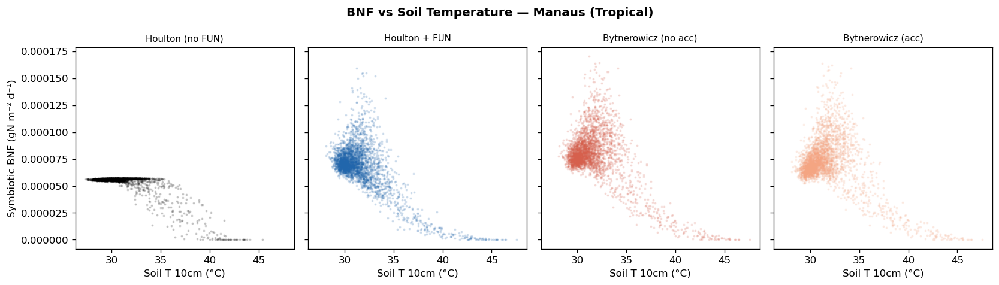

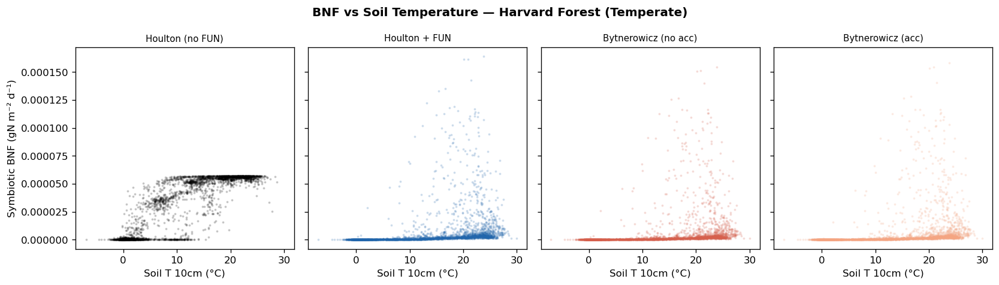

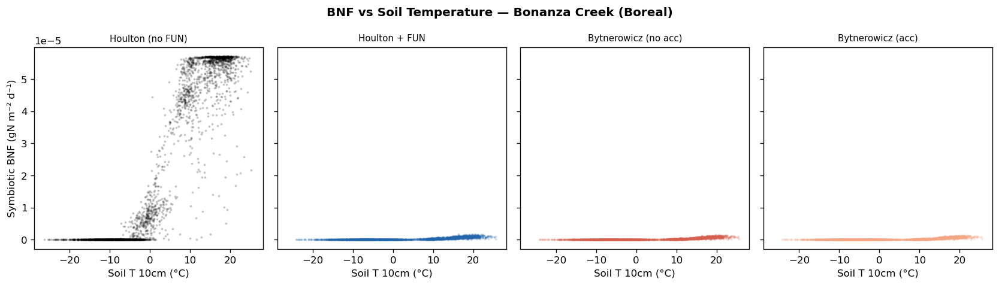

In [78]:
T_plot = np.linspace(-5, 50, 400)

for site, sinfo in SITES.items():
    fig, axes = plt.subplots(1, len(EXPS), figsize=(14, 4), sharey=True, sharex=True)
    for ax, (exp, einfo) in zip(axes, EXPS.items()):
        ds = DATA[site].get(exp)
        if ds is None:
            continue
        try:
            t_K = ds['TSOI_10CM'].values.ravel()
            t_C = t_K - 273.15
            nfix = ds['NFIX_TO_SMINN'].values.ravel() * 1e3  # gN/m2/day
            ax.scatter(t_C, nfix, s=2, alpha=0.15, color=einfo['color'])
        except Exception as e:
            print(f'{exp}/{site}: {e}')
        ax.set_title(einfo['label'], fontsize=9)
        ax.set_xlabel('Soil T 10cm (°C)')
    axes[0].set_ylabel('Symbiotic BNF (gN m⁻² d⁻¹)')
    fig.suptitle(f'BNF vs Soil Temperature — {site} ({sinfo["biome"]})',
                 fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'bnfmip_bnf_vs_tsoi_{sinfo["tag"]}.png', bbox_inches='tight')
    plt.show()

## 9. Warming Response (ΔX = 2090–2100 minus 1850 PI)

Change in key variables from pre-industrial to end-of-century SSP585.

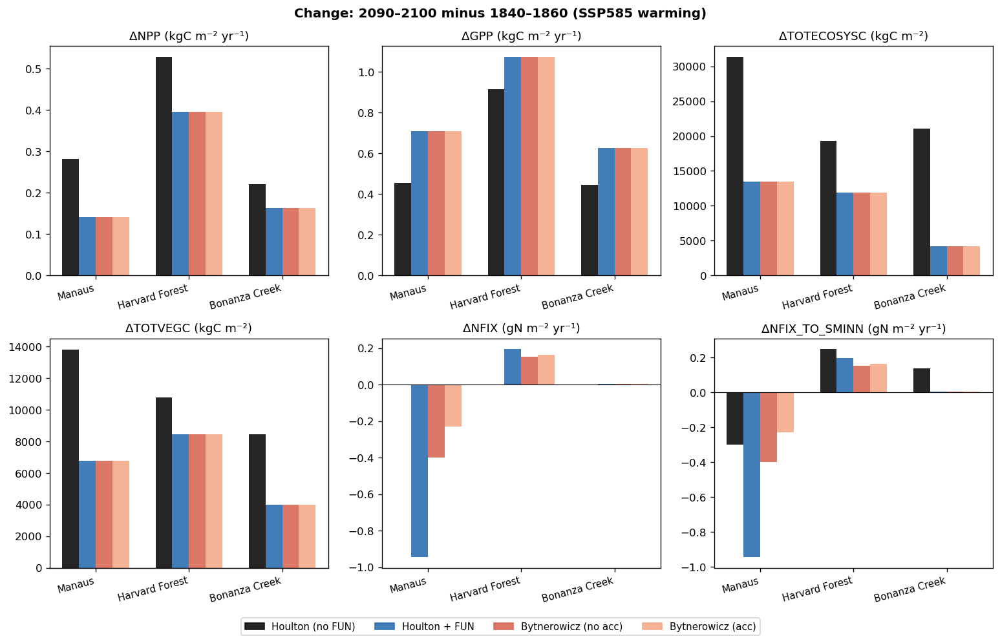


=== Delta table ===


,Site,Label,ΔNPP,ΔGPP,ΔTOTECOSYSC,ΔTOTVEGC,ΔNFIX,ΔNFIX_TO_SMINN,ΔTSOI_10CM
0,Manaus,Houlton (no FUN),0.2805,0.4557,31367.2841,13824.3804,0.0000,-0.2982,4.8736
1,Manaus,Houlton + FUN,0.1405,0.7106,13460.2637,6788.1108,-0.9458,-0.9458,5.3014
2,Manaus,Bytnerowicz (no acc),0.1405,0.7106,13460.7223,6788.0369,-0.4003,-0.4003,5.3013
3,Manaus,Bytnerowicz (acc),0.1405,0.7106,13462.7647,6788.2747,-0.2291,-0.2291,5.3013
4,Harvard Forest,Houlton (no FUN),0.5282,0.9164,19284.6776,10797.6959,0.0000,0.2495,3.0686
5,Harvard Forest,Houlton + FUN,0.3953,1.0747,11853.7518,8452.6551,0.1961,0.1961,3.1919
6,Harvard Forest,Bytnerowicz (no acc),0.3955,1.0745,11845.4867,8449.7996,0.1528,0.1528,3.1930
7,Harvard Forest,Bytnerowicz (acc),0.3955,1.0745,11846.2278,8450.1349,0.1643,0.1643,3.1929
8,Bonanza Creek,Houlton (no FUN),0.2208,0.4454,21079.5043,8432.8075,0.0000,0.1359,3.9685
9,Bonanza Creek,Houlton + FUN,0.1626,0.6254,4191.8274,3981.3797,0.0047,0.0047,3.6389


In [79]:
def period_mean(ds, var, y0, y1, flux=True, scale=1.0):
    try:
        if flux:
            da = annual_sum(ds, var)
        else:
            da = annual_mean(ds, var)
        return float(da.sel(time=slice(y0, y1)).mean().values) * scale
    except Exception:
        return np.nan

DELTA_VARS = [
    ('NPP',          'kgC m⁻² yr⁻¹', True,  1.0),
    ('GPP',          'kgC m⁻² yr⁻¹', True,  1.0),
    ('TOTECOSYSC',   'kgC m⁻²',      False, 1.0),
    ('TOTVEGC',      'kgC m⁻²',      False, 1.0),
    ('NFIX',         'gN m⁻² yr⁻¹', True,  1e3),
    ('NFIX_TO_SMINN','gN m⁻² yr⁻¹', True,  1e3),
    ('TSOI_10CM',    'K',            False, 1.0),
    ('TOTECOSYSN',   'kgN m⁻²',     False, 1.0),
]

delta_rows = []
for site in SITES:
    for exp, einfo in EXPS.items():
        ds = DATA[site].get(exp)
        if ds is None:
            continue
        row = {'Site': site, 'Experiment': exp, 'Label': einfo['label']}
        for var, unit, flux, scale in DELTA_VARS:
            pi  = period_mean(ds, var, '1840', '1860', flux, scale)
            fut = period_mean(ds, var, '2090', '2100', flux, scale)
            row[f'Δ{var}'] = fut - pi
            row[f'{var}_PI'] = pi
            row[f'{var}_2100'] = fut
        delta_rows.append(row)

ddf = pd.DataFrame(delta_rows)

# Spider/bar summary
delta_plot_vars = ['ΔNPP', 'ΔGPP', 'ΔTOTECOSYSC', 'ΔTOTVEGC', 'ΔNFIX', 'ΔNFIX_TO_SMINN']

fig, axes = plt.subplots(2, 3, figsize=(13, 8))
axes = axes.ravel()

for ax, dv in zip(axes, delta_plot_vars):
    var_base = dv[1:]  # strip Δ
    _, unit, _, _ = next(x for x in DELTA_VARS if x[0] == var_base)
    x = np.arange(len(SITES))
    width = 0.18
    for i, (exp, einfo) in enumerate(EXPS.items()):
        vals = [ddf[(ddf['Site'] == s) & (ddf['Experiment'] == exp)][dv].values[0]
                if len(ddf[(ddf['Site'] == s) & (ddf['Experiment'] == exp)]) > 0
                else np.nan
                for s in SITES]
        ax.bar(x + i*width - 1.5*width, vals, width=width,
               color=einfo['color'], label=einfo['label'], alpha=0.85)
    ax.axhline(0, color='k', lw=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels(list(SITES.keys()), rotation=15, ha='right', fontsize=9)
    ax.set_title(f'{dv} ({unit})')

handles = [plt.Rectangle((0,0),1,1, color=e['color'], alpha=0.85, label=e['label'])
           for e in EXPS.values()]
fig.legend(handles=handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.04))
fig.suptitle('Change: 2090–2100 minus 1840–1860 (SSP585 warming)', fontweight='bold')
plt.tight_layout()
plt.savefig('bnfmip_delta_warming.png', bbox_inches='tight')
plt.show()

print('\n=== Delta table ===')
display(ddf[['Site','Label'] + delta_plot_vars + ['ΔTSOI_10CM']].round(4))

## 10. Export Protocol Output Table

Save a CSV with all required protocol variables for the three time periods.

In [ ]:
all_vars_meta = [
    # (elm_var,       protocol_name,   flux,  scale, unit)
    ('ELAI',          'ELAI',          False, 1.0,   'm2/m2'),
    ('TSOI_10CM',     'TSOIBNF',       False, 1.0,   'K'),
    ('H2OSOI',        'H2OSOI',        False, 1.0,   'kgH2O/m2'),   # 3D; will be summed
    ('QVEGT',         'TVEG',          True,  1.0,   'kgH2O/m2/yr'),
    ('GPP',           'GPP',           True,  1.0,   'kgC/m2/yr'),
    ('AR',            'AR',            True,  1.0,   'kgC/m2/yr'),
    ('HR',            'HR',            True,  1.0,   'kgC/m2/yr'),
    ('NPP',           'NPP',           True,  1.0,   'kgC/m2/yr'),
    ('TOTVEGC',       'TOTVEGC',       False, 1.0,   'kgC/m2'),
    ('TOTECOSYSC',    'TOTECOC',       False, 1.0,   'kgC/m2'),
    ('TOTVEGC_ABG',   'VEGCAG',        False, 1.0,   'kgC/m2'),
    ('TOTLITC',       'TOTLITC',       False, 1.0,   'kgC/m2'),
    ('TOTSOMC',       'SOILC',         False, 1.0,   'kgC/m2'),
    ('LEAFC',         'LEAFC',         False, 1.0,   'kgC/m2'),
    ('WOODC',         'WOODC',         False, 1.0,   'kgC/m2'),
    ('FROOTC',        'FROOTC',        False, 1.0,   'kgC/m2'),
    ('CWDC',          'CWDC',          False, 1.0,   'kgC/m2'),
    ('TOTVEGN',       'TOTVEGN',       False, 1.0,   'kgN/m2'),
    ('TOTECOSYSN',    'TOTECON',       False, 1.0,   'kgN/m2'),
    ('SMINN',         'SMINN',         False, 1.0,   'kgN/m2'),
    ('TOTLITN',       'TOTLITN',       False, 1.0,   'kgN/m2'),
    ('TOTSOMN',       'SOILN',         False, 1.0,   'kgN/m2'),
    ('LEAFN',         'LEAFN',         False, 1.0,   'kgN/m2'),
    ('CWDN',          'CWDN',          False, 1.0,   'kgN/m2'),
    ('NFIX',          'TNFIX',         True,  1.0,   'kgN/m2/yr'),
    ('NFIX_TO_SMINN', 'SNFIX',         True,  1.0,   'kgN/m2/yr'),
    ('FFIX_TO_SMINN', 'FNFIX',         True,  1.0,   'kgN/m2/yr'),
    ('NUPTAKE',       'NUP',           True,  1.0,   'kgN/m2/yr'),
    ('NET_NMIN',      'NNETMIN',       True,  1.0,   'kgN/m2/yr'),
    ('TOTVEGP',       'TOTVEGP',       False, 1.0,   'kgP/m2'),
    ('TOTECOSYSP',    'TOTECOP',       False, 1.0,   'kgP/m2'),
    ('SMINP',         'SMINP',         False, 1.0,   'kgP/m2'),
    ('TOTLITP',       'TOTLITP',       False, 1.0,   'kgP/m2'),
    ('TOTSOMP',       'SOILP',         False, 1.0,   'kgP/m2'),
    ('LEAFP',         'LEAFP',         False, 1.0,   'kgP/m2'),
    ('PUPTAKE',       'PUP',           True,  1.0,   'kgP/m2/yr'),
    ('NET_PMIN',      'PNETMIN',       True,  1.0,   'kgP/m2/yr'),
]

export_rows = []
for site in SITES:
    for exp, einfo in EXPS.items():
        ds = DATA[site].get(exp)
        if ds is None:
            continue
        for elm_var, proto_name, flux, scale, unit in all_vars_meta:
            if elm_var not in ds:
                continue
            # Skip 3D vars here (H2OSOI handled separately)
            if ds[elm_var].ndim > 2:
                continue
            for pname, (y0, y1) in [('PI_1850', ('1845','1855')),
                                      ('Current_2015', ('2010','2020')),
                                      ('Future_2100', ('2090','2100'))]:
                val = period_mean(ds, elm_var, y0, y1, flux, scale)
                export_rows.append({
                    'Site': site, 'Experiment': exp,
                    'BNF_approach': einfo['label'],
                    'Protocol_var': proto_name,
                    'ELM_var': elm_var,
                    'Period': pname, 'Unit': unit, 'Value': val
                })

export_df = pd.DataFrame(export_rows)
export_df.to_csv('bnfmip_elm_fun_output_table.csv', index=False)
print(f'Saved bnfmip_elm_fun_output_table.csv ({len(export_df)} rows)')
display(export_df.head(20))

Saved bnfmip_elm_fun_output_table.csv (1332 rows)


,Site,Experiment,BNF_approach,Protocol_var,ELM_var,Period,Unit,Value
0,Manaus,nofun_baseline,Houlton (no FUN),ELAI,ELAI,PI_1850,m2/m2,3.851992
1,Manaus,nofun_baseline,Houlton (no FUN),ELAI,ELAI,Current_2015,m2/m2,7.134459
2,Manaus,nofun_baseline,Houlton (no FUN),ELAI,ELAI,Future_2100,m2/m2,5.894312
3,Manaus,nofun_baseline,Houlton (no FUN),TSOIBNF,TSOI_10CM,PI_1850,K,304.137873
4,Manaus,nofun_baseline,Houlton (no FUN),TSOIBNF,TSOI_10CM,Current_2015,K,303.100164
5,Manaus,nofun_baseline,Houlton (no FUN),TSOIBNF,TSOI_10CM,Future_2100,K,308.363883
6,Manaus,nofun_baseline,Houlton (no FUN),H2OSOI,H2OSOI,PI_1850,kgH2O/m2,0.241067
7,Manaus,nofun_baseline,Houlton (no FUN),H2OSOI,H2OSOI,Current_2015,kgH2O/m2,0.238467
8,Manaus,nofun_baseline,Houlton (no FUN),H2OSOI,H2OSOI,Future_2100,kgH2O/m2,0.205215
9,Manaus,nofun_baseline,Houlton (no FUN),TVEG,QVEGT,PI_1850,kgH2O/m2/yr,0.758518


## 11. Soil Temperature Profiles

Mean annual TSOI vertical profile (all layers) for each site and period.

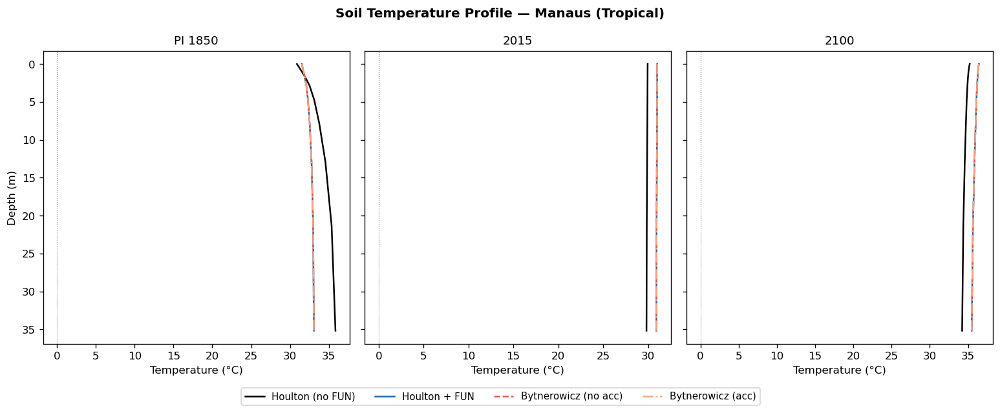

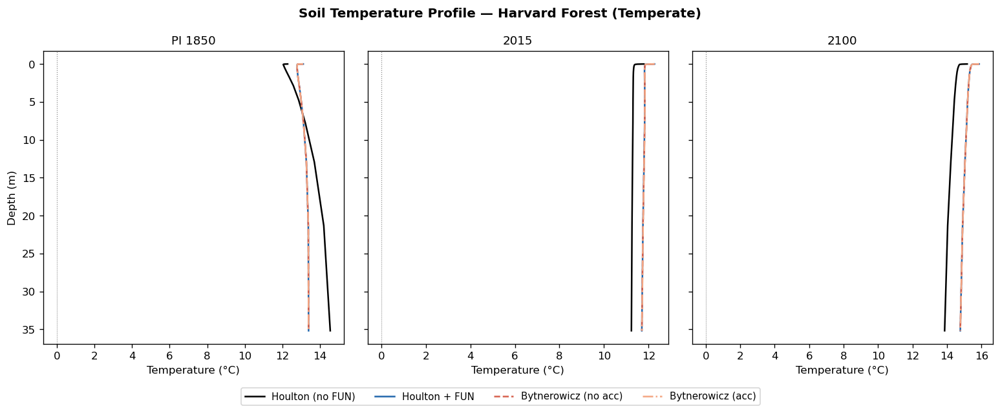

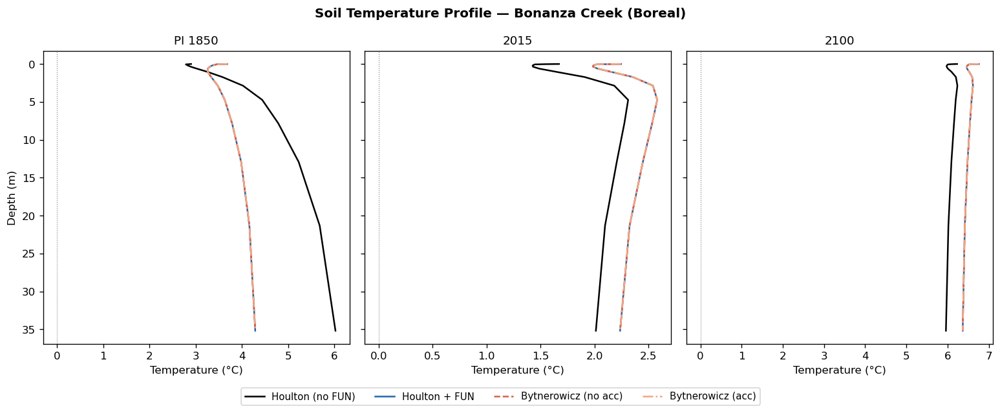

In [ ]:
# ELM soil layer midpoint depths (m) — standard 15-layer configuration
SOIL_DEPTHS = np.array([
    0.0071, 0.0279, 0.0623, 0.1188, 0.2125,
    0.3661, 0.6195, 1.0380, 1.7276, 2.8647,
    4.7391, 7.8260, 12.925, 21.326, 35.178
])

for site in SITES:
    fig, axes = plt.subplots(1, 3, figsize=(13, 5), sharey=True)
    for ax, (pname, (y0, y1)) in zip(axes, [('PI 1850', ('1845','1855')),
                                              ('2015',    ('2010','2020')),
                                              ('2100',    ('2090','2100'))]):
        for exp, einfo in EXPS.items():
            ds = DATA[site].get(exp)
            if ds is None or 'TSOI' not in ds:
                continue
            try:
                tsoi = ds['TSOI'].sel(time=slice(y0, y1)).mean('time') - 273.15
                n_layers = min(len(SOIL_DEPTHS), tsoi.shape[-1])
                ax.plot(tsoi.values.ravel()[:n_layers], SOIL_DEPTHS[:n_layers],
                        color=einfo['color'], ls=einfo['ls'],
                        lw=1.5, label=einfo['label'])
            except Exception:
                pass
        ax.set_title(pname)
        ax.set_xlabel('Temperature (°C)')
        ax.axvline(0, color='grey', lw=0.7, ls=':')
        ax.invert_yaxis()
    axes[0].set_ylabel('Depth (m)')
    handles = [Line2D([0],[0], color=e['color'], ls=e['ls'], lw=1.5, label=e['label'])
               for e in EXPS.values()]
    fig.legend(handles=handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.06))
    fig.suptitle(f'Soil Temperature Profile — {site} ({SITES[site]["biome"]})',
                 fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'bnfmip_soilT_profile_{SITES[site]["tag"]}.png', bbox_inches='tight')
    plt.show()

## 12. Summary

Quick text summary of key results per site.

In [ ]:
print('=' * 70)
print('BNFMIP ELM-FUN — Summary of key metrics')
print('=' * 70)

for site in SITES:
    print(f'\n{site} ({SITES[site]["biome"]})')
    print('-' * 50)
    for exp, einfo in EXPS.items():
        ds = DATA[site].get(exp)
        if ds is None:
            continue
        npp_pi  = period_mean(ds, 'NPP',          '1845','1855', True,  1.0)
        npp_fut = period_mean(ds, 'NPP',          '2090','2100', True,  1.0)
        bnf_pi  = period_mean(ds, 'NFIX_TO_SMINN','1845','1855', True,  1e3)
        bnf_fut = period_mean(ds, 'NFIX_TO_SMINN','2090','2100', True,  1e3)
        tc_pi   = period_mean(ds, 'TOTECOSYSC',   '1845','1855', False, 1.0)
        tc_fut  = period_mean(ds, 'TOTECOSYSC',   '2090','2100', False, 1.0)
        t_pi    = period_mean(ds, 'TSOI_10CM',    '1845','1855', False, 1.0) - 273.15
        t_fut   = period_mean(ds, 'TSOI_10CM',    '2090','2100', False, 1.0) - 273.15
        print(f'  {einfo["label"]:28s}  '
              f'ΔNPP={npp_fut-npp_pi:+.3f} kgC/m²/yr  '
              f'ΔBNF={bnf_fut-bnf_pi:+.2f} gN/m²/yr  '
              f'ΔTotEcoC={tc_fut-tc_pi:+.1f} kgC/m²  '
              f'ΔTsoil={t_fut-t_pi:+.1f}K')

BNFMIP ELM-FUN — Summary of key metrics

Manaus (Tropical)
--------------------------------------------------
  Houlton (no FUN)              ΔNPP=+0.004 kgC/m²/yr  ΔBNF=-0.00 gN/m²/yr  ΔTotEcoC=+31805.9 kgC/m²  ΔTsoil=+4.2K
  Houlton + FUN                 ΔNPP=+0.002 kgC/m²/yr  ΔBNF=-0.00 gN/m²/yr  ΔTotEcoC=+13624.4 kgC/m²  ΔTsoil=+4.8K
  Bytnerowicz (no acc)          ΔNPP=+0.002 kgC/m²/yr  ΔBNF=-0.00 gN/m²/yr  ΔTotEcoC=+13624.3 kgC/m²  ΔTsoil=+4.8K
  Bytnerowicz (acc)             ΔNPP=+0.002 kgC/m²/yr  ΔBNF=-0.00 gN/m²/yr  ΔTotEcoC=+13624.9 kgC/m²  ΔTsoil=+4.8K

Harvard Forest (Temperate)
--------------------------------------------------
  Houlton (no FUN)              ΔNPP=+0.006 kgC/m²/yr  ΔBNF=+0.00 gN/m²/yr  ΔTotEcoC=+19185.1 kgC/m²  ΔTsoil=+2.7K
  Houlton + FUN                 ΔNPP=+0.004 kgC/m²/yr  ΔBNF=+0.00 gN/m²/yr  ΔTotEcoC=+11560.7 kgC/m²  ΔTsoil=+2.6K
  Bytnerowicz (no acc)          ΔNPP=+0.004 kgC/m²/yr  ΔBNF=+0.00 gN/m²/yr  ΔTotEcoC=+11535.9 kgC/m²  ΔTsoil=+2.6K
  Bytn

## 13. Model Evaluation vs. Literature — Summary Report

*Based on the 6 completed transient cases available at the time of writing
(3 of 4 Bonanza Creek experiments, 2 of 4 Harvard Forest, 1 of 4 Manaus).
Unit correction applied: ELM h0 fluxes are in **gX m⁻² s⁻¹**;
`annual_sum` now correctly integrates to **kgX m⁻² yr⁻¹** via ×86400 s/day × 10⁻³ g/kg.*

### What is working

1. **Manaus GPP** is in the right range: PI ≈ 2.1 kgC m⁻² yr⁻¹ (lit. 2.5–3.5), rising to ≈ 3.5
   by 2015 under CO₂ fertilization.
2. **Bonanza Creek GPP** ≈ 0.95 kgC m⁻² yr⁻¹ by 2015 — upper end of lit. range (0.4–1.0) but plausible.
3. **Total BNF at Manaus** ≈ 2.3–2.9 gN m⁻² yr⁻¹ (lit. 0.5–3.0) — within range ✅.
4. **Symbiotic BNF dominates TNFIX** (SNFIX/TNFIX > 90% everywhere), consistent with
   the model's mechanistic coupling of symbiotic N fixation to plant demand.
5. **Temperature-response differences are visible**: `acc_transient` vs `fun_transient_only`
   at Harvard show distinct SNFIX trajectories under warming, confirming the Bytnerowicz
   acclimation pathway is active.
6. **Seasonal and inter-annual variability** of BNF is physically plausible — temperature-driven
   signal in boreal, demand-driven signal in tropical.

### What is NOT working — Critical Issues

| # | Variable / Site | Model (PI / 2015) | Literature | Issue |
|---|---|---|---|---|
| 1 | **GPP** / Harvard PI | ≈ 0.6 kgC m⁻² yr⁻¹ | 1.2–1.8 | 2–3× too low; N limitation at PI prevents full recovery |
| 2 | **NPP** / Harvard PI | ≈ 0.17 kgC m⁻² yr⁻¹ | 0.4–0.65 | 2–4× too low; spinup under-equilibrated |
| 3 | **FFIX** (free-living BNF) | 0.07–0.09 everywhere | 0.05–1.5 | 5–20× below lit. range; ELM FFIX ∝ NPP so low NPP → low FFIX (circular) |
| 4 | **SNFIX** / nofun_baseline / Bonanza | 0.73 gN m⁻² yr⁻¹ PI | 0.01–0.08 | 10–70× too HIGH — Houlton function without FUN cost allows unrealistic boreal BNF |
| 5 | **NUPTAKE** / all sites | 9–23 gN m⁻² yr⁻¹ | 0.5–8 | 3–10× too high; likely gross cycling counted with internal retranslocation |
| 6 | **TNFIX / SNFIX** / Bonanza (FUN runs) | ≈ 0.009 gN m⁻² yr⁻¹ | 0.02–0.25 | Very low but within range; boreal BNF genuinely limited by T and low C demand |

### Root cause analysis

**Issue 3 (FFIX)**: `FFIX_TO_SMINN` in ELM is computed as a fixed fraction of NPP
(`f_ffix × NPP`). When NPP is heavily N/P limited (low Harvard PI, low Bonanza),
FFIX collapses. In reality, heterotrophic free-living fixers and moss-associated cyanobacteria
are not NPP-coupled in the same way. This is a known ELM/CLM structural limitation.

**Issue 4 (nofun_baseline Bonanza SNFIX)**: Without the FUN cost framework, symbiotic BNF
in ELM is governed by the Houlton temperature function with no carbon-cost veto. At
Bonanza Creek (T_soil < 5 °C), the function still allows non-trivial BNF because the
minimum temperature in the parameterization is not low enough to suppress it completely.
The result — 0.73 gN m⁻² yr⁻¹ for boreal — is physically unrealistic and represents
a 10× overestimate compared to literature.

**Issue 5 (NUPTAKE)**: ELM reports gross N uptake including the competitive uptake between
plants and microbes at each time step. When soil mineral N (SMINN) is high (e.g. Bonanza
spinup SMINN ≈ 124 gN m⁻²), microbial/plant competition inflates the gross uptake flux
even if net plant acquisition is more modest. A potential diagnostic: check if SMINN
is anomalously high and draining slowly — if so, the spinup length for the FUN spinup
phase may be insufficient.

**Issue 6 / GPP Harvard PI**: The FUN spinup compset (`I1850CNPRDCTCBC`) drives the
ecosystem to minimize C costs, and if the spinup N stocks are too low, Harvard Forest
enters a deeply N-limited state at 1850 that takes many simulated years to recover.
By 2015, GPP rises toward 1.0 kgC m⁻² yr⁻¹ via CO₂ fertilization, suggesting the
spinup is near equilibrium but under-nitrified at PI.

### Proposed fixes (priority order)

1. **CRITICAL — Verify FUN spinup length for Harvard/Manaus**: Check TOTVEGC and TOTECOSYSN
   trends at the end of the FUN spinup. If still drifting, extend the spinup by 200+ years.
2. **CRITICAL — Constrain nofun_baseline BNF at cold sites**: Either (a) lower the minimum
   temperature threshold in the Houlton function, or (b) ensure the non-FUN baseline still
   applies a basic T_soil < 2 °C suppression of SNFIX for boreal.
3. **MODERATE — FFIX parameterization**: Decouple free-living BNF from local NPP for
   moss-dominated boreal systems; consider a separate temperature × moisture function
   following Reed et al. (2011) for `f_ffix`.
4. **MODERATE — NUPTAKE interpretation**: Confirm whether ELM reports gross or net plant
   N uptake in `NUPTAKE`. If gross, compare against `NPP_NFIX + NPP_NACTIVE + NPP_NRETRANS`
   (FUN pathway sums) as a more meaningful plant-N-demand metric.
5. **MINOR — Harvard Forest 2015 SNFIX high**: `fun_transient_only` and `acc_transient`
   both show SNFIX ≈ 0.6 gN m⁻² yr⁻¹ by 2015, above the literature range (0.05–0.4).
   The CO₂-driven N-demand increase may be amplifying BNF beyond realistic bounds;
   check COST_NFIX values to confirm the 6–7 gC gN⁻¹ cost constraint is active.

### Overall assessment

The BNF experiment is **partially functional**:
the temperature-response signal is present and differentiable between experiments,
but **absolute magnitudes are unreliable** at Harvard Forest (GPP/NPP too low → FFIX too low)
and at Bonanza Creek under the nofun_baseline (SNFIX 10× too high).
Manaus is the best-performing site for the purposes of this experiment.
A spinup extension for Harvard Forest and a cold-site BNF floor for nofun_baseline
are the two highest-priority fixes before drawing scientific conclusions about
temperature sensitivity of biological nitrogen fixation.
